# **Bank Churners Prediction**

**Dataset:** https://www.kaggle.com/datasets/sakshigoyal7/credit-card-customers/data <br>
**Zadatak:** *Binarna klasifikacija tabelarnih podataka, koji sadrže katergoričke i numeričke atribute, kako bi se detektovali potencijalni korisnici koji su skloni napuštanju banke.* <br>
**Metode klasifikacije:** *Reč je o nebalansiranom datasetu, pa će se za klasifikaciju ovakvih podataka koristiti različite ensamble metode kako bismo dobili bolje rezultate.* AdaBoost, StackingClassifier, BaggingClassifier i VotingClassifier.

## Importovanje korišćenih biblioteka

In [180]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import sklearn.model_selection as model_selection
from sklearn.decomposition import PCA
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
import sklearn.compose as compose
import sklearn.pipeline as pipeline
import sklearn.preprocessing as preproc
import sklearn.feature_selection as feat_selection
from itertools import chain
import sklearn.metrics
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.metrics import PrecisionRecallDisplay
from helper_functions import *
from scipy.stats import uniform, randint

# modeli
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC, LinearSVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import VotingClassifier, StackingClassifier, AdaBoostClassifier, BaggingClassifier

In [181]:
import warnings

pd.set_option('display.max_columns', 25)
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Učitavanje podataka

In [182]:
dataset_url = './dataset/BankChurners.csv'

df = pd.read_csv(dataset_url, sep=",")

In [183]:
df.shape

(10127, 23)

In [184]:
df.tail(5)

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,3,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462,0.000191,0.999810
10123,710638233,Attrited Customer,41,M,2,Unknown,Divorced,$40K - $60K,Blue,25,4,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511,0.995270,0.004729
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,5,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000,0.997880,0.002118
10125,717406983,Attrited Customer,30,M,2,Graduate,Unknown,$40K - $60K,Blue,36,4,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000,0.996710,0.003294
10126,714337233,Attrited Customer,43,F,2,Graduate,Married,Less than $40K,Silver,25,6,2,4,10388.0,1961,8427.0,0.703,10294,61,0.649,0.189,0.996620,0.003377


In [185]:
df.drop(["CLIENTNUM", "Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1", "Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2"], axis=1, inplace=True)
df.drop_duplicates(inplace=True)

Poslednje dve kolone dataseta brišemo, jer nisu od interesa za klasifikaciju (što je i navedeno u opisu dataseta: https://www.kaggle.com/datasets/sakshigoyal7/credit-card-customers/data). Odmah brišemo i kolonu CLIENTNUM, koja predstavlja ID klijenta i takođe ne nosi nikakve značajne informacije za klasifikaciju.

In [186]:
df.shape

(10127, 20)

## EDA - Istraživačka analiza podataka, pretprocesiranje, ekstrakcija atributa

In [187]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  object 
 1   Customer_Age              10127 non-null  int64  
 2   Gender                    10127 non-null  object 
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           10127 non-null  object 
 5   Marital_Status            10127 non-null  object 
 6   Income_Category           10127 non-null  object 
 7   Card_Category             10127 non-null  object 
 8   Months_on_book            10127 non-null  int64  
 9   Total_Relationship_Count  10127 non-null  int64  
 10  Months_Inactive_12_mon    10127 non-null  int64  
 11  Contacts_Count_12_mon     10127 non-null  int64  
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       10127 non-null  int64  
 14  Avg_Op

Vidimo da naš dataset sadrži: <br>
- kategoričke atribute: (*Gender*, *Education_Level*, *Marital Status*, *Income_Category*, *Card_Category*) <br>
- numeričke atribute: (*Customer_Age*, *Dependent_Count*, *Months_on_book*, *Total_Relationship_Count*, *Months_Inactive_12_mon*, *Contacts_Count_12_mon*, *Credit_Limit*, *Total_Revolving_Bal*, *Avg_Open_To_Buy*, *Total_Amt_Chng_Q4_Q1*,            *Total_Trans_Amt*, *Total_Trans_Ct*, *Total_Ct_Chng_Q4_Q1*, *Avg_Utilization_Ratio*).

Neki od kategoričkih atributa su **nominalni** (*Gender*, *Marital_Status*), dok su ostali **ordinalni**. <br>
Neki numerički atributi su **kontinualni** (svi atributi tipa *float64*), dok su atributi tipa *int64* **diskretni**. <br>
**Klasni atribut** je *Attrition_Flag*.

U nastavku vizuelizujemo raspodele numeričkih atributa i trakaste grafikone kategoričkih atributa korišćenjem biblioteke **Seaborn**.

In [188]:
attrs = {
    "categorical": {
        "nominal": ["Gender", "Marital_Status"],
        "ordinal": ["Education_Level", "Income_Category", "Card_Category"],
    },
    "numerical": [attr for attr in df.select_dtypes(include=["float64", "int64"]).columns],
    "target": "Attrition_Flag"
}

attrs

{'categorical': {'nominal': ['Gender', 'Marital_Status'],
  'ordinal': ['Education_Level', 'Income_Category', 'Card_Category']},
 'numerical': ['Customer_Age',
  'Dependent_count',
  'Months_on_book',
  'Total_Relationship_Count',
  'Months_Inactive_12_mon',
  'Contacts_Count_12_mon',
  'Credit_Limit',
  'Total_Revolving_Bal',
  'Avg_Open_To_Buy',
  'Total_Amt_Chng_Q4_Q1',
  'Total_Trans_Amt',
  'Total_Trans_Ct',
  'Total_Ct_Chng_Q4_Q1',
  'Avg_Utilization_Ratio'],
 'target': 'Attrition_Flag'}

In [189]:
sns.set_theme()

<Axes: ylabel='count'>

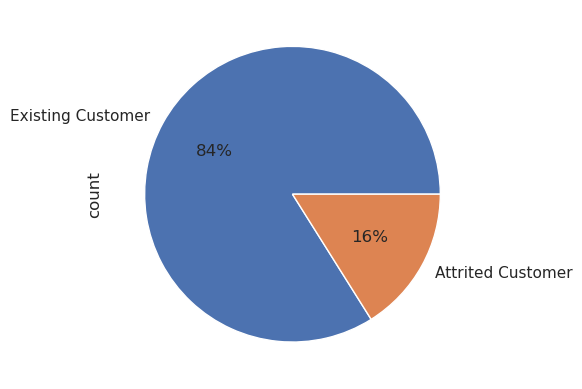

In [190]:
df["Attrition_Flag"].value_counts().plot(kind="pie", autopct='%.0f%%')

Možemo da vidimo da je naš dataset loše balansiran - značajno imamo manje korisnika koji su napustili banku (samo 16%), što može da oteža definisanje dobrog modela klasifikacije.

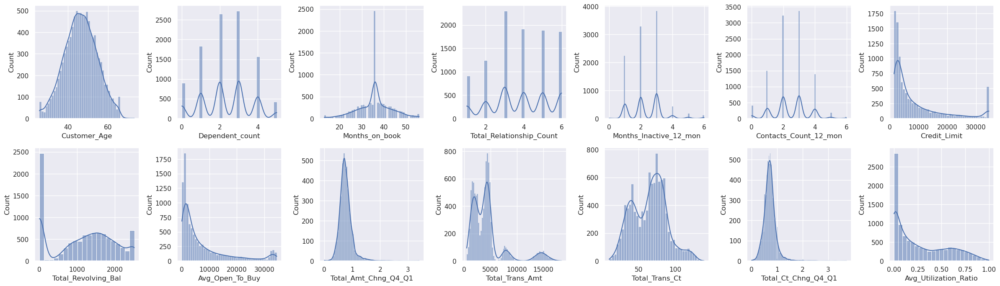

In [191]:
fig, ax = plt.subplots(2, 7, figsize=(24, 7))
ax = ax.flatten()

for i, col_name in enumerate(attrs["numerical"]):
    sns.histplot(data=df, x=col_name, kde=True, ax=ax[i])

fig.tight_layout()

In [192]:
df.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
count,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000
mean,46.325960,2.346203,35.928409,3.812580,2.341167,2.455317,8631.953698,1162.814061,7469.139637,0.759941,4404.086304,64.858695,0.712222,0.274894
std,8.016814,1.298908,7.986416,1.554408,1.010622,1.106225,9088.776650,814.987335,9090.685324,0.219207,3397.129254,23.472570,0.238086,0.275691
min,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,10.000000,0.000000,0.000000
25%,41.000000,1.000000,31.000000,3.000000,2.000000,2.000000,2555.000000,359.000000,1324.500000,0.631000,2155.500000,45.000000,0.582000,0.023000
50%,46.000000,2.000000,36.000000,4.000000,2.000000,2.000000,4549.000000,1276.000000,3474.000000,0.736000,3899.000000,67.000000,0.702000,0.176000
75%,52.000000,3.000000,40.000000,5.000000,3.000000,3.000000,11067.500000,1784.000000,9859.000000,0.859000,4741.000000,81.000000,0.818000,0.503000
max,73.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,3.397000,18484.000000,139.000000,3.714000,0.999000


Na osnovu histograma raspodele numeričkih atributa možemo da primetimo sledeće interesantne stvari:
- Atributi *Credit_Limit* i *Total_Revolving_Balance* imaju neobično veliki skok učestalosti za desnom kraju - ovo može da sugeriše da je za ove atribute postavljena fiksna gornja vrednost, koja ne oslikava pravo stanje stvari. U realnim primerima bi raspodela pomenutih atributa izgledala slično kao npr. kod atributa *Avg_Utilization_Ratio*.
- Atribut *Months_on_book* koji predstavlja broj meseci od kako je korisnik postalo korisnik banke ima izražen **modus** za vrednost 36 - ovo može biti potencijalna greška koju je potrebno proveriti. Kada bi ova vrednost bila manje izražena, raspodela ovog atibuta bi bila približna normalnoj raspodeli što se i prirodno očekuje.

Proverićemo ova tvrđenja u nastavku.

In [193]:
max_credit_limit = df["Credit_Limit"].max()
n__limit_max = df[df["Credit_Limit"] == max_credit_limit].shape[0]
print(f'Najveci limit kreditne kartice je: {max_credit_limit}')
print(f'Cak {n__limit_max} vrsta ima ovu vrednost za maksimalni limit')

Najveci limit kreditne kartice je: 34516.0
Cak 508 vrsta ima ovu vrednost za maksimalni limit


In [194]:
max_revolving_bal = df["Total_Revolving_Bal"].max()
n_rev_max = df[df["Total_Revolving_Bal"] == max_revolving_bal].shape[0]
print(f'Najveci vrednost za revolving_balnce je: {max_revolving_bal}')
print(f'Cak {n_rev_max} vrsta ima ovu vrednost za revolving_balance')

Najveci vrednost za revolving_balnce je: 2517
Cak 508 vrsta ima ovu vrednost za revolving_balance


Vidimo da čak postoji isti broj vrsta (508) sa vrednostima *Total_Revolving_Balance* i *Credit_Limit* postavljene na maksimalnu. Ovo ne može biti slučajno. Postoje dve opcije - ili ove vrednosti nedostaju "u parovima" pa su nasumično popunjene maksimalnim vrednostima (što je manje verovanto) ili postoje korisnici koji nemaju limit na kreditnim karticama, koji je iz tog razloga postavljen na max. Takođe, je logično očekivati da ovi korisnici mogu imati veće zaostale dugove, zbog čega je njihov revolving_balance postavljen na maksimalnu vrednost. Ova druga mogućnost je verovatnija.

In [195]:
mnth_on_book_mode = df["Months_on_book"].mode()[0]
n_mode = df[df["Months_on_book"] == mnth_on_book_mode].shape[0]
print(f'Modus za atribut Months_on_book je: {mnth_on_book_mode} i ovu vrednost ima {n_mode} vrsta.')

Modus za atribut Months_on_book je: 36 i ovu vrednost ima 2463 vrsta.


Čak oko 24% vrsta (2463 od 10127) ima najučestaliju vrednost za atribut *Months_on_book*. Iako je ovde potencijalno u pitanju neka greška, postoji i druga mogućnost (npr. moguće je da se inicialni ugovor potpisuje na 3 godine, nakon čega dosta korisnika odluči da prekine saradnju sa bankom). Kako nije moguće naći dodatne informacije o ovom konkretnom skupu podataka, za sada ćemo se držati ove druge pretpostavke.

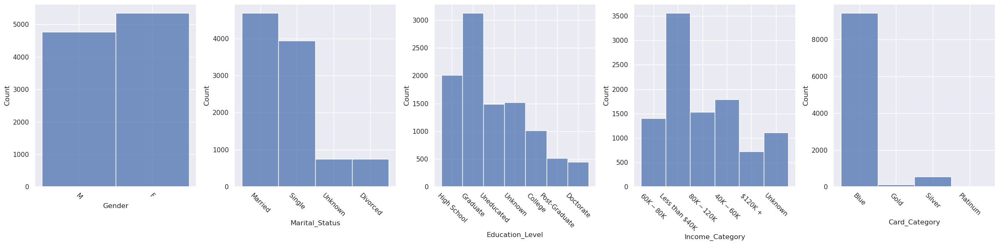

In [196]:
fig, ax = plt.subplots(1, 5, figsize=(24, 6))
categorical = list(chain.from_iterable(attrs["categorical"].values()))

for i, col_name in enumerate(categorical):
    p = sns.histplot(data=df, x=col_name, kde=False, ax=ax[i])
    p.set_xticklabels(labels=p.get_xticklabels(), rotation=-45)

fig.tight_layout()


Nedostajuće vrednosti:
- Bitno je da primetimo da kod kategoričkih atributa *Marital_Status*, *Education_Level* i *Income_Category* imamo određeni broj vrsta sa nedostajućim vrednostima - koje su u ovom datasetu označene sa **Unknown**. U nastavku ćemo prvenstveno rešiti ovaj problem, a zatim se vratiti na dalju analizu gore pomenutih atributa *Credit_Limit* i *Total_Revolving_Bal*.

Pre analize nedostajućih vrednosti odvajamo deo dataseta (20%) za testiranje i ostavljamo ga po strani. Kako bi skup za testiranje verodostojno oslikavao realni odnos klasa koji je pristupan u originalnom skupu podataka, koristimo stratifikovanu podelu.

### Train-test podela

In [197]:
train, test = model_selection.train_test_split(df, test_size=0.2, stratify=df["Attrition_Flag"], random_state=42)

In [198]:
train.shape

(8101, 20)

In [199]:
test.shape

(2026, 20)

In [200]:
train["Attrition_Flag"].value_counts()

Attrition_Flag
Existing Customer    6799
Attrited Customer    1302
Name: count, dtype: int64

In [201]:
test["Attrition_Flag"].value_counts()

Attrition_Flag
Existing Customer    1701
Attrited Customer     325
Name: count, dtype: int64

In [202]:
train_cp = train.copy(deep=True)

U nastavku će se analiza vršiti i vrednosti ćemo popunjavati u trening skupu, kako bi konačna procena modela na test skupu bila što nepristrasnija (ostavljanjem test skupa po strani sprečava se slučajno "curenje" tj. uticaj ovih podataka na parametre u komeponenti za pretprocesiranje, kao i na sam model).

### Upravljanje nedostajućim vrednostima

Pre nego što izaberemo način kojim ćemo rešiti problem nedostajućih vrednosti, potrebno je odrediti koji je tip nedostajućih podataka. Generalno postoje 3 tipa:
- **MCAR - Missing completely at random**:  nedostajuće vrednosti se mogu pojaviti u bilo kojoj vrsti sa jednakom verovatnoćom
- **MAR - Missing at random**:  pojava nedostajuće vrednosti može zavisiti od ostalih atributa u datasetu, ali ne i od samog atributa čija vrednost nedostaje
- **MNAR - Missing NOT at random**: postoji razlog za pojavu nedostajuće vrednosti (npr. u slučaju nekih privatnih pitanja, kao što je status veze, korinici često izbegavaju da daju odgovor).

Intuitivno je logično da su u slučaju atributa koje imamo ove nedostajuće vrednosti upravo **MNAR** tipa (na pitanje bračnog statusa korisnici u nerećnim vezama, ili razvedeni korisnici su verovatniji da izbegnu da daju odgovor, slično važi i za pitanje obrazovanja i prihoda), pa ćemo ovo i proveriti.

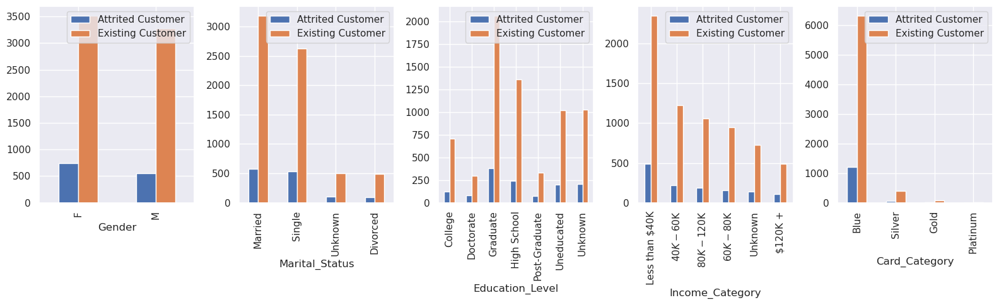

In [203]:
categorical = list(chain.from_iterable(attrs["categorical"].values()))
fig, ax = plt.subplots(1, len(categorical), figsize=(16, 5))
ax = ax.flatten()

for i, attr in enumerate(categorical):
    temp_df = pd.DataFrame({"Attrited Customer": train_cp[train_cp["Attrition_Flag"] == "Attrited Customer"][attr].value_counts(),
                            "Existing Customer": train_cp[train_cp["Attrition_Flag"] == "Existing Customer"][attr].value_counts()})
    temp_df.plot(kind="bar", ax=ax[i])

fig.tight_layout()

Na prvi pogled deluje da nijedan od ovih kategorickih atributa ne utice bitnije na raspodelu target klase, ali cemo to detaljnije ispitati.

#### Marital_Status atribut

Text(0.5, 1.0, 'Slika 1 - Raspodela target klase u zavisnoti od Merital_Status vrednosti')

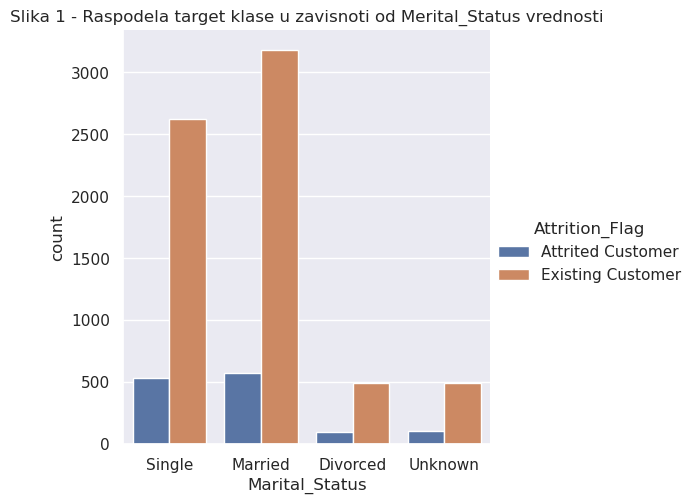

In [204]:
sns.catplot(data=train_cp, x="Marital_Status", hue="Attrition_Flag", kind="count")
plt.title("Slika 1 - Raspodela target klase u zavisnoti od Merital_Status vrednosti")

In [205]:
pca = PCA(n_components=2, svd_solver="auto", random_state=42)

education_categories = ["Unknown", "Uneducated", "High School", "College", "Graduate", "Post-Graduate", "Doctorate"]
income_categories = ["Unknown", "Less than $40K", "$40K - $60K", "$60K - $80K", "$80K - $120K", "$120K +"]
card_categories=["Blue", "Silver", "Gold", "Platinum"]

nominal_pipeline = pipeline.make_pipeline(preproc.OneHotEncoder(drop="if_binary"))
ordinal_pipeline = pipeline.make_pipeline(preproc.OrdinalEncoder(categories=[education_categories, income_categories, card_categories]))

transformer = compose.ColumnTransformer([
    ("nominal_transformer", nominal_pipeline, attrs["categorical"]["nominal"]),
    ("ordinal_transformer", ordinal_pipeline, attrs["categorical"]["ordinal"])
], remainder="passthrough")


transformed_train_cp = transformer.fit_transform(train_cp.drop("Attrition_Flag", axis=1))
train_2d = pca.fit_transform(transformed_train_cp)

In [206]:
vis_train_df = train_cp[["Education_Level", "Marital_Status", "Income_Category", "Attrition_Flag"]].copy(deep=True)
vis_train_df["x"] = train_2d[:, 0]
vis_train_df["y"] = train_2d[:, 1]

Text(0.5, 1.0, 'Slika 2 - Prikaz svih podataka i klase kojoj pripadaju')

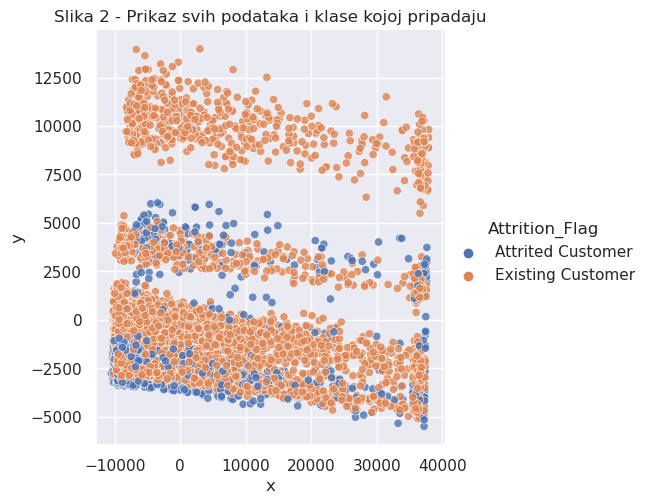

In [207]:
sns.relplot(data=vis_train_df, x="x", y="y", hue="Attrition_Flag", alpha=0.8)
plt.title("Slika 2 - Prikaz svih podataka i klase kojoj pripadaju")

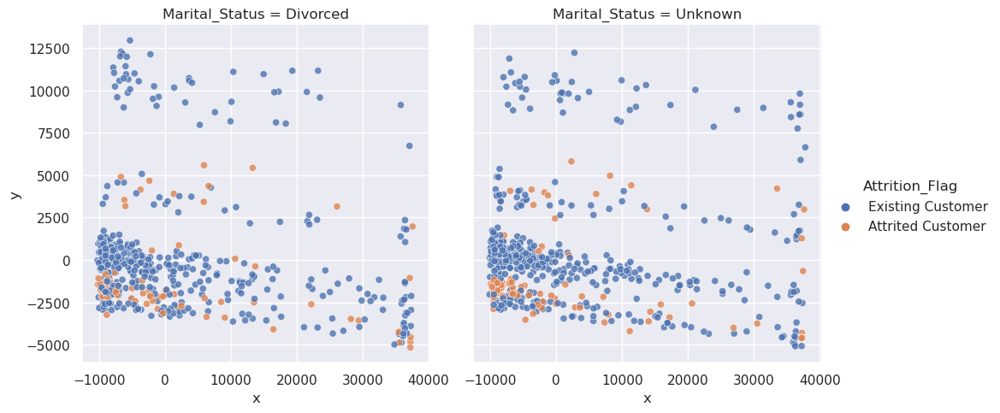

In [208]:
filtered = vis_train_df[(vis_train_df["Marital_Status"] == "Unknown") | (vis_train_df["Marital_Status"] == "Divorced")]
sns.relplot(data=filtered, x="x", y="y", hue="Attrition_Flag", col="Marital_Status", alpha=0.8)

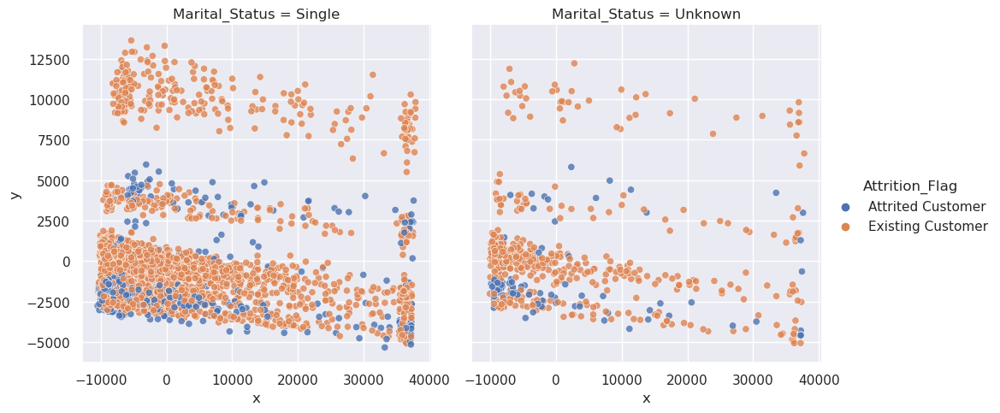

In [209]:
filtered = vis_train_df[(vis_train_df["Marital_Status"] == "Unknown") | (vis_train_df["Marital_Status"] == "Single")]
sns.relplot(data=filtered, x="x", y="y", hue="Attrition_Flag", col="Marital_Status", alpha=0.8)

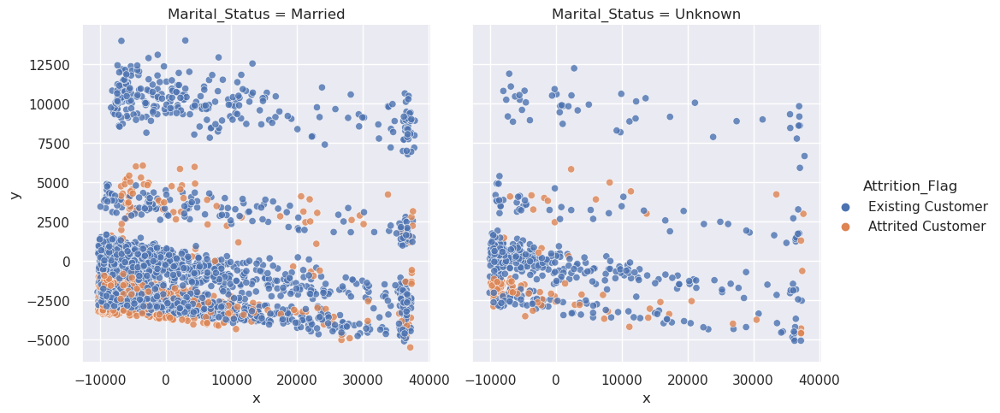

In [210]:
filtered = vis_train_df[(vis_train_df["Marital_Status"] == "Unknown") | (vis_train_df["Marital_Status"] == "Married")]
sns.relplot(data=filtered, x="x", y="y", hue="Attrition_Flag", col="Marital_Status", alpha=0.8)

Text(0.5, 1.0, 'Slika 3 - Prikaz podataka u 2d prostoru po vrednosti atributa Marital_Status')

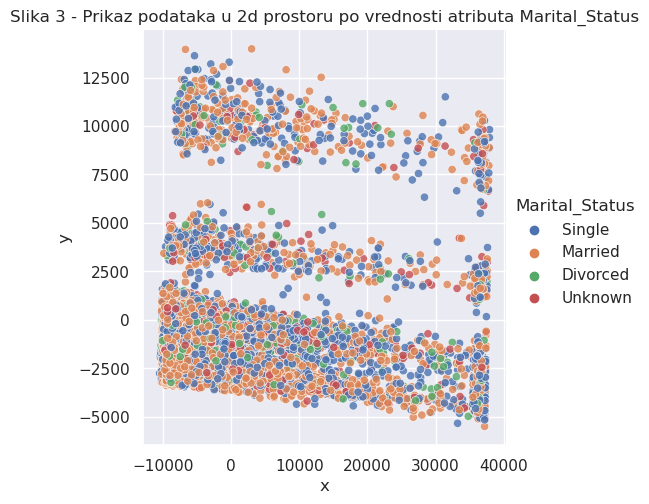

In [211]:
sns.relplot(data=vis_train_df, x="x", y="y", hue="Marital_Status", alpha=0.8)
plt.title("Slika 3 - Prikaz podataka u 2d prostoru po vrednosti atributa Marital_Status")

Text(0.5, 0.98, 'Slika 4 - Pairplots')

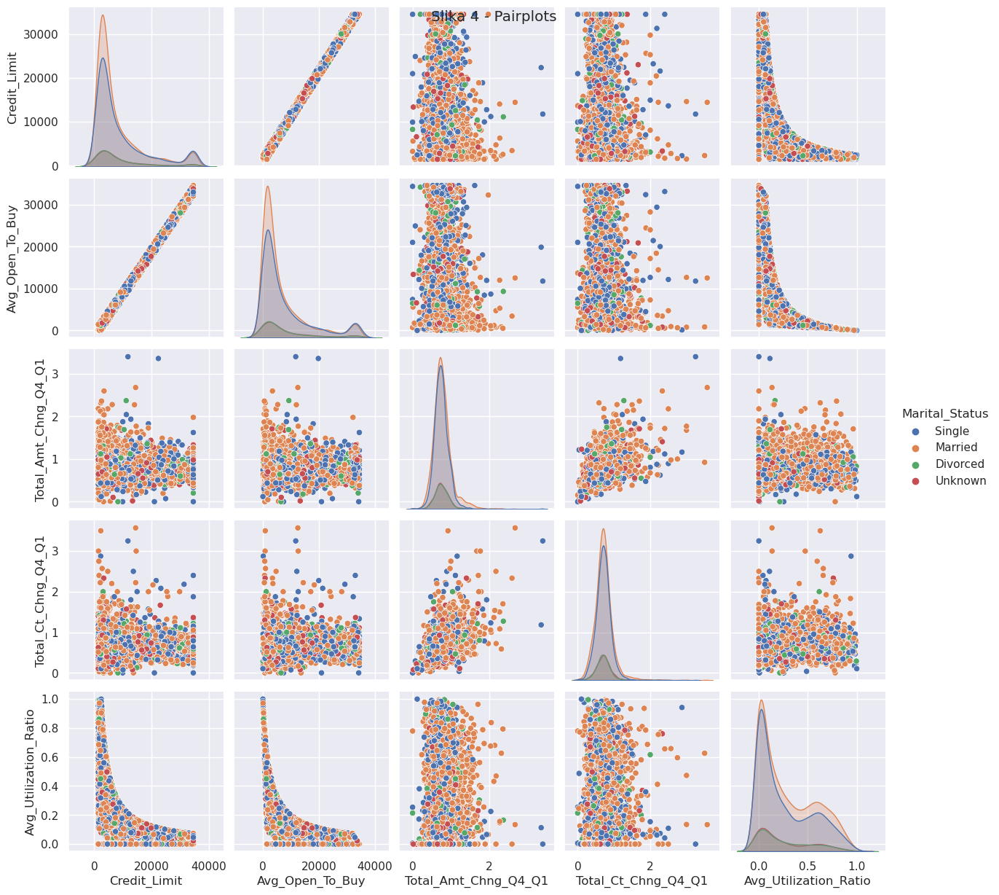

In [212]:
sns.pairplot(data=train_cp[list(train_cp.select_dtypes(include=["float64"]).columns) + ["Marital_Status"]], hue="Marital_Status")
plt.suptitle("Slika 4 - Pairplots")

Text(0.5, 0.98, 'Slika 5 - Raspodela kategoričkih atributa u zavisnosti od Marital_Status')

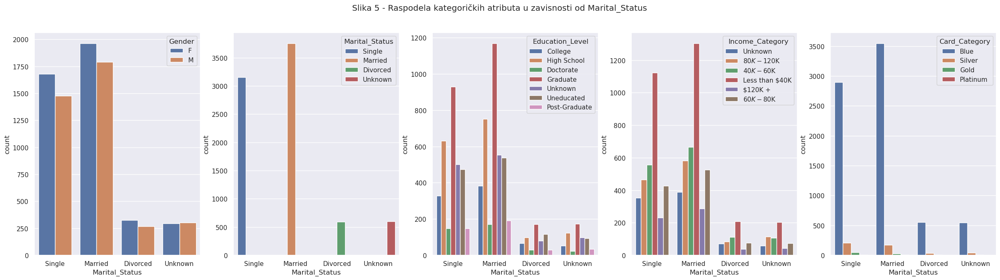

In [213]:
sfig, ax = plt.subplots(1, 5, figsize=(30, 7))

categorical = list(chain.from_iterable(attrs["categorical"].values()))

for i, col in enumerate(categorical):
    sns.countplot(data=train_cp, x="Marital_Status", hue=col, ax=ax[i])
plt.suptitle("Slika 5 - Raspodela kategoričkih atributa u zavisnosti od Marital_Status")

In [214]:
def enc_marital(marital_status):
    if marital_status == "Unknown":
        return 0
    elif marital_status == "Single":
        return 1
    elif marital_status == "Divorced":
        return 2
    elif marital_status == "Married":
        return 3
    return -1

In [215]:
marital_status_enc = train_cp["Marital_Status"].apply(enc_marital)
marital_status_enc.value_counts()

Marital_Status
3    3755
1    3156
0     599
2     591
Name: count, dtype: int64

In [216]:
chi2_marital, p_val = feat_selection.chi2(marital_status_enc.to_numpy().reshape(-1, 1), train_cp["Attrition_Flag"])
chi2_marital, p_val

(array([2.24430997]), array([0.13410672]))

In [217]:
cleaned_df = train_cp[train_cp["Marital_Status"] != "Unknown"]
marital_status_enc = cleaned_df["Marital_Status"].apply(enc_marital)
marital_status_enc.value_counts()

Marital_Status
3    3755
1    3156
2     591
Name: count, dtype: int64

In [218]:
chi2_marital, p_val = feat_selection.chi2(marital_status_enc.to_numpy().reshape(-1, 1), cleaned_df["Attrition_Flag"])
chi2_marital, p_val

(array([1.42989281]), array([0.23178193]))

Za 3 stepena slobode, i p=0.05 chi2-critical iznosi 7.815 što je značajno veće od 2.24 kolika je naša chi2 vrednost. Zbog toga zaključujemo da se hipoteza o nezavisnosti atributa *Marital_Status* i target atributa *Attrition_Flag* ne može odbaciti, tj. smatramo da su nezavisne. Isto važi i ako ukolonimo Unkown kao moguću vrednost.

**Na osnovu slike 1 koji prikazuje odnos target klase u zavisnosti od vrednosti atributa *Marital_Status* možemo da primetimo da je raspodela gotovo identična za vrednosti **Unknown** i **Divorced**, kao i da postoji gotovo identičan broj vrsta sa ove dve vrednosti. Da bismo dalje ispitali ovo tvrđenje odrađena je vizuelizacija svih podataka u 2d prostoru korišćenjem PCA algoritma za redukciju dimenzionalnosti. Posmatrane su sličnosti na dijagramima rasipanja za svaku moguću vrednost atributa *Marital_Status* i vrednosti Unknown. Sa ovih dijagrama takođe možemo da uočimo sličnost između vrednosti Divorced i Unknown. Međutim, ove sličnosti su najevidentnije posmatranjem slika 4 i 5.<font color='cyan'>Na osnovu slike 4 ne samo što uočavamo da je raspodela numeričkih atributa gotovo identična za vrednosti Unknown i Divorced, već se uočava i ogromna sličnost između vrednosti Single i Married. Na osnovu slike 5 zaključujemo istu stvar i za kategoričke atribute. Ovi zakljuci sugerišu da vrednost atributa *Marital_Status* ne utiče bitno na to kojoj klasi korisnik pripada. Da bismo ovo potvrdili koristili smo hi-kvadrat test za proveru nezavisnosti između kategoričkih atributa i rezultati ovog testa su nam i potvrdili ovu teoriju.</font><br>
<font color='red'>Zbog navedenih zaključaka, odbacićemo ovaj atribut u nastavku!</font>**

**Još jedan bitan podatak smo otkrili prikazom pairplot-ova je da su atributi *Avg_Open_To_Buy* i *Credit_Limit* potpuno linearno korelisani, što nam i potvrđuje matrica korelacije sa slike 6 ispod. <font color='red'>Zbog toga ćemo odbaciti i atribut *Avg_Open_To_Buy*</font>**.

Text(0.5, 1.0, 'Slika 6 - Matrica korelacije')

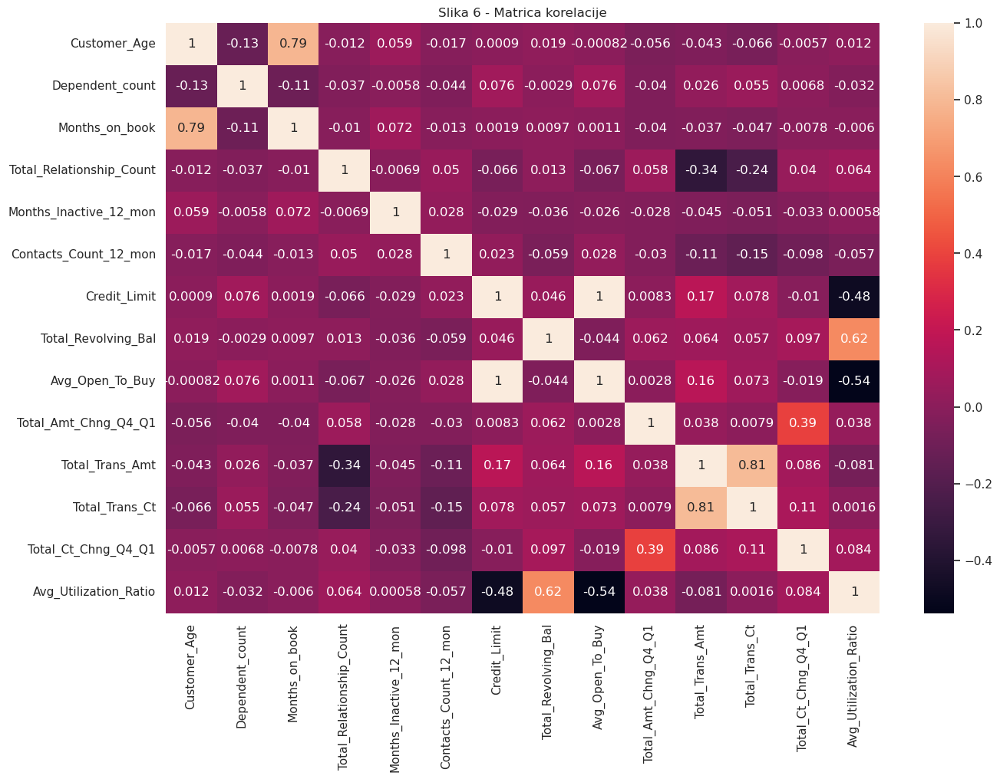

In [219]:
plt.figure(figsize=(15, 10))
sns.heatmap(train_cp[attrs["numerical"]].corr(), annot=True)
plt.title("Slika 6 - Matrica korelacije")

Osim pomenute korelacije, uočavamo i da postoji visoka korelacija između atributa *Total_Trans_Amt* i *Total_Trans_Ct* (što je i logično). Da bismo to rešili, transformisacemo ova dva atributa u jedan, koji ce predstavljati prosecnu potrošnju korisnika po transakciji i posmatracemo koji od ova tri atributa daje najbolju tacnost klasifikacije. Takođe postoji visoka korelacija između atributa *Customer_Age* i *Months_on_book* i *Total_Revolving_Bal* i *Avg_Utilization_Ratio*.

In [220]:
train_cp["Avg_Trans_Amt"] = train_cp["Total_Trans_Amt"] / train_cp["Total_Trans_Ct"]
attrs["numerical"].append("Avg_Trans_Amt")

<Axes: xlabel='Avg_Trans_Amt', ylabel='Count'>

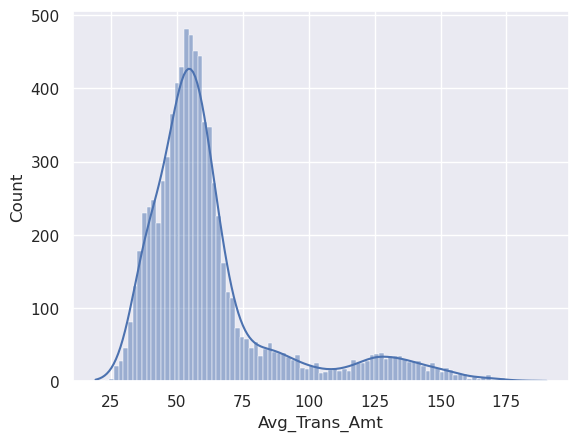

In [221]:
sns.histplot(data=train_cp, x="Avg_Trans_Amt", kde=True)

In [222]:
train_cp = train_cp.drop(["Marital_Status", "Avg_Open_To_Buy"], axis=1)

#### Education_Level atribut

Sličnu analizu sprovodimo i za atribut *Education_Level*.

Text(0.5, 1.0, 'Slika 7 - Raspodela target klase u zavisnoti od Education_Level vrednosti')

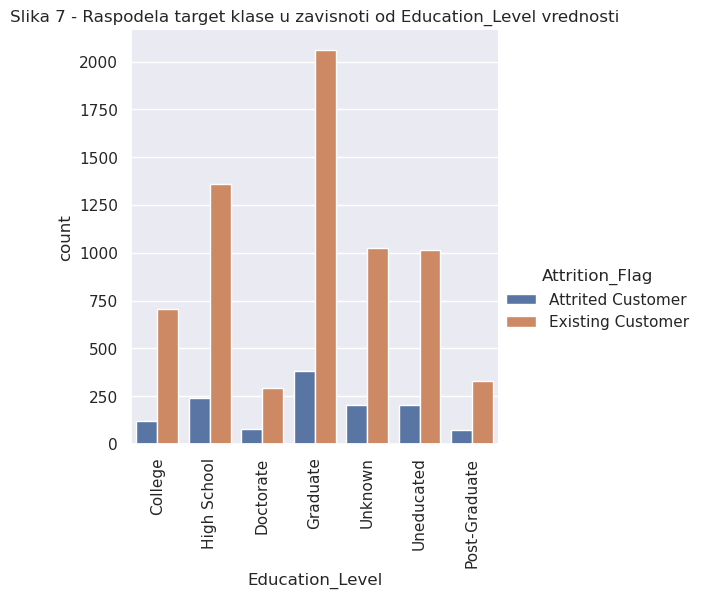

In [223]:
p = sns.catplot(data=train_cp, x="Education_Level", hue="Attrition_Flag", kind="count")

for ax in p.axes.flat:
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

plt.title("Slika 7 - Raspodela target klase u zavisnoti od Education_Level vrednosti")

Text(0.5, 0.98, 'Slika 8 - Pairplots')

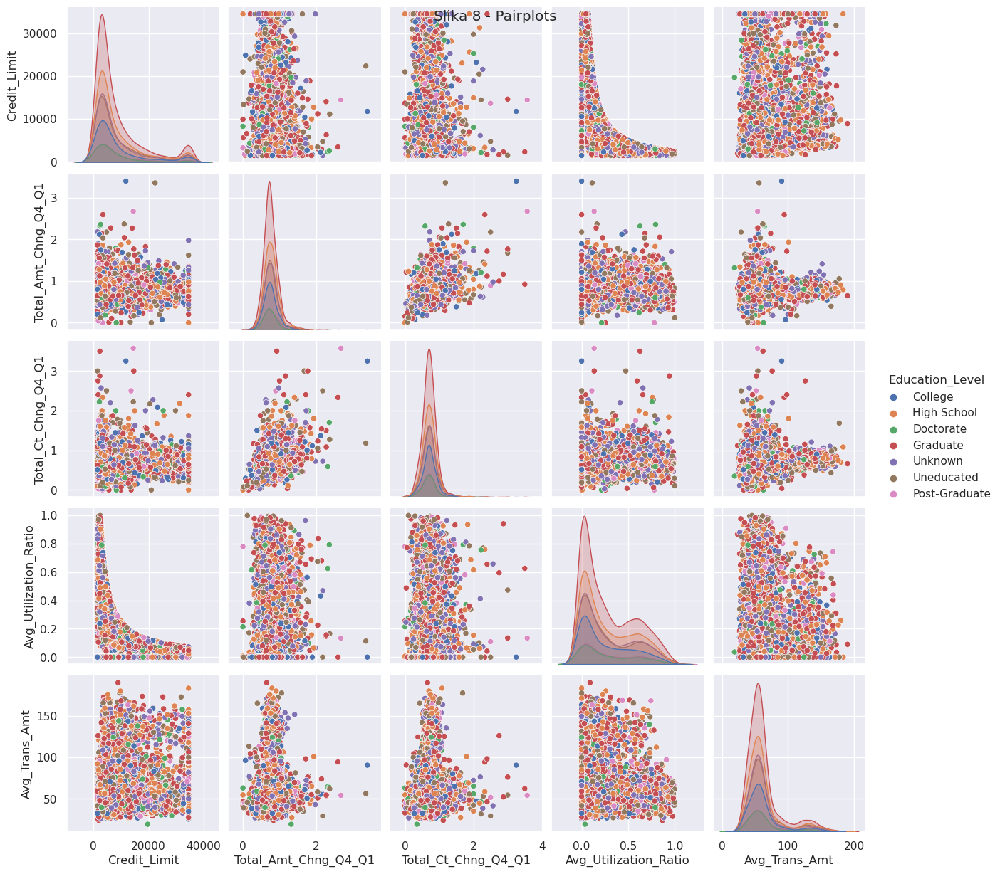

In [224]:
sns.pairplot(data=train_cp[list(train_cp.select_dtypes(include=["float64"]).columns) + ["Education_Level"]], hue="Education_Level")
plt.suptitle("Slika 8 - Pairplots")

Text(0.5, 0.98, 'Slika 9 - Raspodela kategoričkih atributa u zavisnosti od Education_Level')

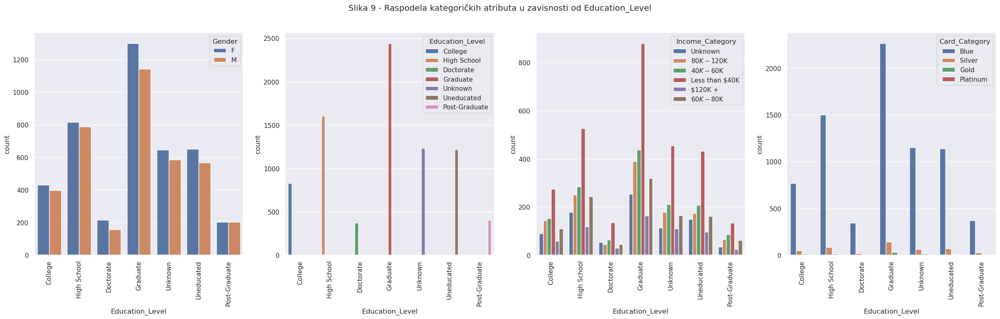

In [225]:
sfig, ax = plt.subplots(1, 4, figsize=(30, 7))

categorical = list(chain.from_iterable(attrs["categorical"].values()))
categorical.remove("Marital_Status")

for i, col in enumerate(categorical):
    p = sns.countplot(data=train_cp, x="Education_Level", hue=col, ax=ax[i])
    p.set_xticklabels(labels=p.get_xticklabels(), rotation=90)

plt.suptitle("Slika 9 - Raspodela kategoričkih atributa u zavisnosti od Education_Level")

In [226]:
def enc_edu(edu_level):
    if edu_level == "Unknown":
        return 0
    elif edu_level == "Uneducated":
        return 1
    elif edu_level == "High School":
        return 2
    elif edu_level == "College":
        return 3
    elif edu_level == "Graduate":
        return 4
    elif edu_level == "Post-Graduate":
        return 5
    elif edu_level == "Doctorate":
        return 6
    return -1

In [227]:
education_level_enc = train_cp["Education_Level"].apply(enc_edu)
education_level_enc.value_counts()

Education_Level
4    2442
2    1603
0    1232
1    1219
3     829
5     404
6     372
Name: count, dtype: int64

In [228]:
chi2_education, p_val = feat_selection.chi2(education_level_enc.to_numpy().reshape(-1, 1), train_cp["Attrition_Flag"])
chi2_education, p_val

(array([0.61852657]), array([0.43159535]))

In [229]:
cleaned_df = train_cp[train_cp["Education_Level"] != "Unknown"]
edu_level_enc = cleaned_df["Education_Level"].apply(enc_edu)
edu_level_enc.value_counts()

Education_Level
4    2442
2    1603
1    1219
3     829
5     404
6     372
Name: count, dtype: int64

In [230]:
chi2_education, p_val = feat_selection.chi2(edu_level_enc.to_numpy().reshape(-1, 1), cleaned_df["Attrition_Flag"])
chi2_education, p_val

(array([1.41727517]), array([0.23385242]))

In [231]:
cleaned_df = train_cp[(train_cp["Education_Level"] != "Unknown") & (train_cp["Income_Category"] != "Unknown")]
edu_level_enc = cleaned_df["Education_Level"].apply(enc_edu)
edu_level_enc.value_counts()

Education_Level
4    2188
2    1425
1    1070
3     739
5     370
6     318
Name: count, dtype: int64

In [232]:
chi2_education, p_val = feat_selection.chi2(edu_level_enc.to_numpy().reshape(-1, 1), cleaned_df["Income_Category"])
chi2_education, p_val

(array([1.89777194]), array([0.75455428]))

**I u slučaju atributa *Education_Level* možemo da izvedemo isti zaključak kao i za *Marital_Status*, kako na osnovu grafikona, tako i na osnovu chi2 vrednosti.<br>
<font color='red'>Zbog toga odbacujemo i ovaj atribut u nastavku!</font>**

In [233]:
train_cp = train_cp.drop(["Education_Level"], axis=1)
train_cp.shape

(8101, 18)

#### Income Category

Na kraju, na isti način analiziramo i poslednji atribut koji ima nedostajuće vrednosti a to je *Income_Category*.

Text(0.5, 1.0, 'Slika 10 - Raspodela target klase u zavisnoti od Income_Category vrednosti')

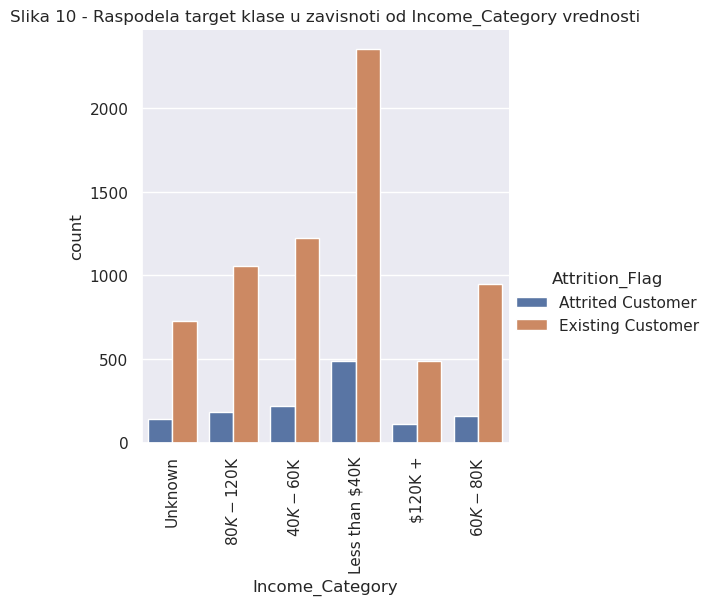

In [234]:
p = sns.catplot(data=train_cp, x="Income_Category", hue="Attrition_Flag", kind="count")

for ax in p.axes.flat:
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

plt.title("Slika 10 - Raspodela target klase u zavisnoti od Income_Category vrednosti")

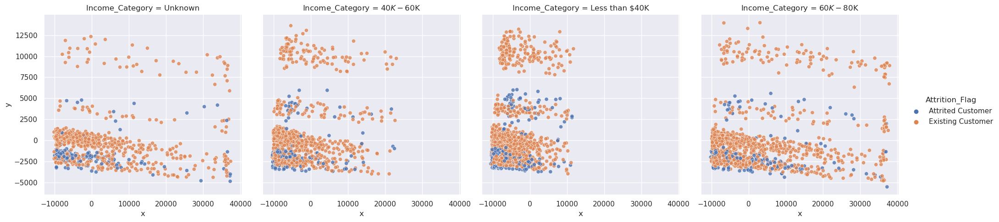

In [235]:
filtered = vis_train_df[(vis_train_df["Income_Category"] == "Unknown") | (vis_train_df["Income_Category"] == "Less than $40K") | (vis_train_df["Income_Category"] == "$40K - $60K") | (vis_train_df["Income_Category"] == "$60K - $80K")]
sns.relplot(data=filtered, x="x", y="y", hue="Attrition_Flag", col="Income_Category", alpha=0.8)

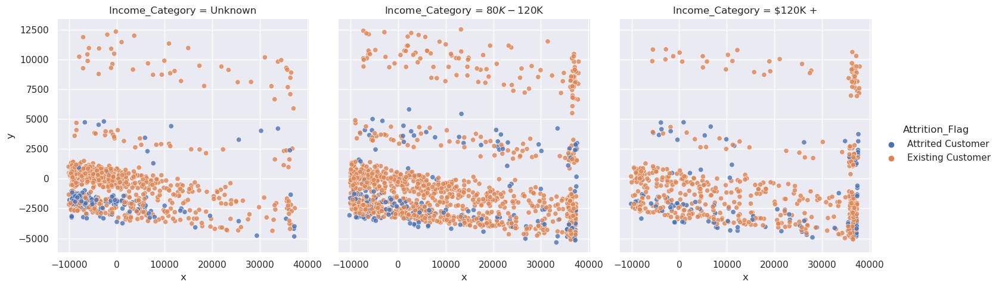

In [236]:
filtered = vis_train_df[(vis_train_df["Income_Category"] == "Unknown") | (vis_train_df["Income_Category"] == "$80K - $120K") | (vis_train_df["Income_Category"] == "$120K +")]
sns.relplot(data=filtered, x="x", y="y", hue="Attrition_Flag", col="Income_Category", alpha=0.8)

Text(0.5, 0.98, 'Slika 11 - Pairplots')

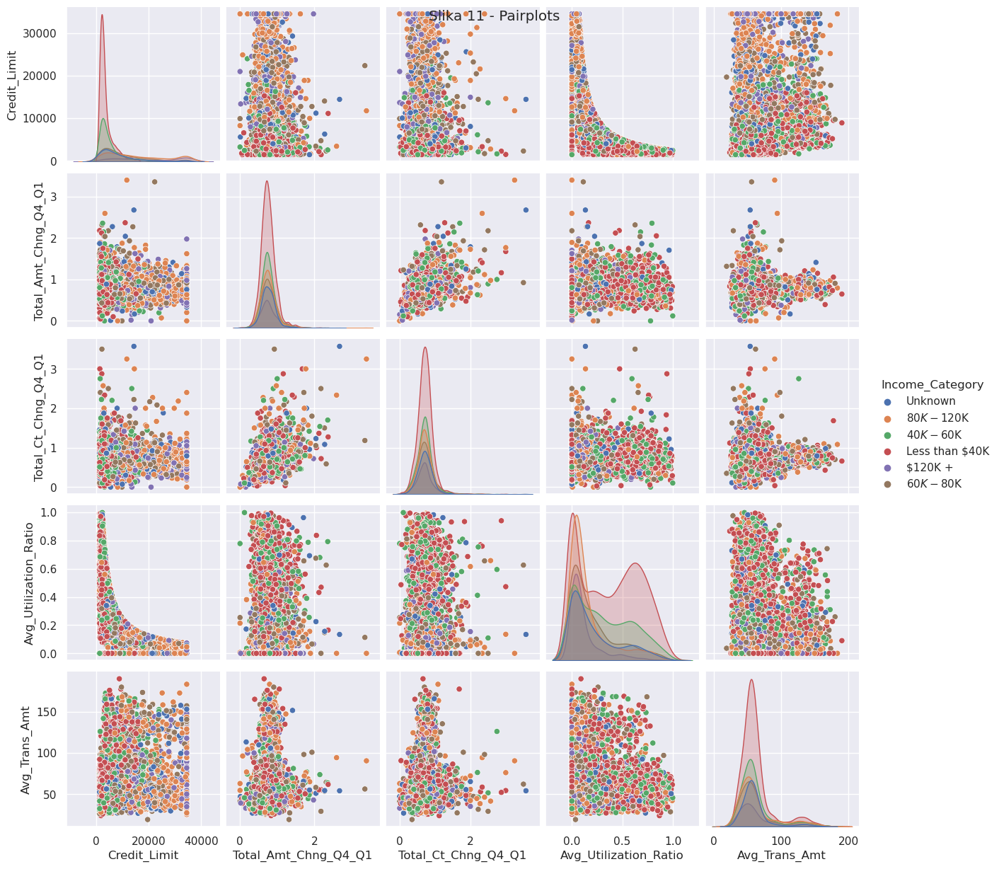

In [237]:
sns.pairplot(data=train_cp[list(train_cp.select_dtypes(include=["float64"]).columns) + ["Income_Category"]], hue="Income_Category")
plt.suptitle("Slika 11 - Pairplots")

Text(0.5, 0.98, 'Slika 12 - Raspodela kategoričkih atributa u zavisnosti od Income_Category')

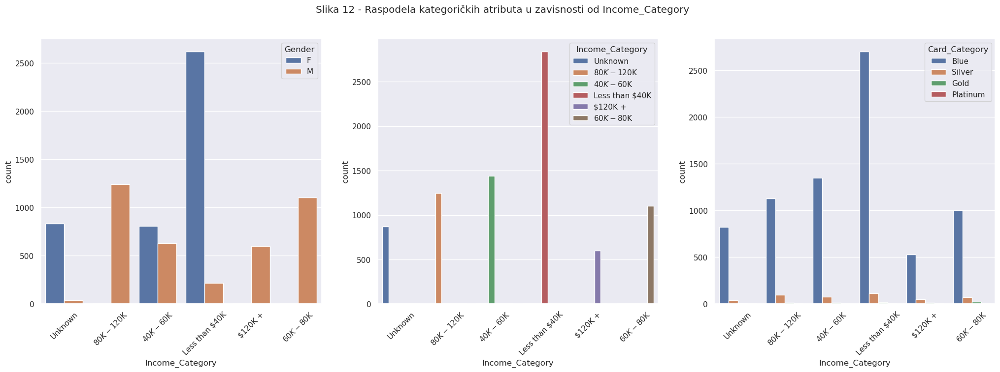

In [238]:
sfig, ax = plt.subplots(1, 3, figsize=(25, 7))

categorical = list(chain.from_iterable(attrs["categorical"].values()))
categorical.remove("Marital_Status")
categorical.remove("Education_Level")

for i, col in enumerate(categorical):
    p = sns.countplot(data=train_cp, x="Income_Category", hue=col, ax=ax[i])
    p.set_xticklabels(labels=p.get_xticklabels(), rotation=45)

plt.suptitle("Slika 12 - Raspodela kategoričkih atributa u zavisnosti od Income_Category")

In [239]:
def enc_income(income_cat):
    if income_cat == "Unknown":
        return 0
    elif income_cat == "Less than $40K":
        return 1
    elif income_cat == "$40K - $60K":
        return 2
    elif income_cat == "$60K - $80K":
        return 3
    elif income_cat == "$80K - $120K":
        return 4
    elif income_cat == "$120K +":
        return 5
    return -1

In [240]:
income_cat_enc = train_cp["Income_Category"].apply(enc_income)
income_cat_enc.value_counts()

Income_Category
1    2838
2    1442
4    1244
3    1104
0     873
5     600
Name: count, dtype: int64

In [241]:
chi2_income, p_val = feat_selection.chi2(income_cat_enc.to_numpy().reshape(-1, 1), train_cp["Attrition_Flag"])
chi2_income, p_val

(array([0.65823063]), array([0.41718529]))

In [242]:
cleaned_df = train_cp[train_cp["Income_Category"] != "Unknown"]
income_cat_enc = cleaned_df["Income_Category"].apply(enc_income)
income_cat_enc.value_counts()

Income_Category
1    2838
2    1442
4    1244
3    1104
5     600
Name: count, dtype: int64

In [243]:
chi2_income, p_val = feat_selection.chi2(income_cat_enc.to_numpy().reshape(-1, 1), cleaned_df["Attrition_Flag"])
chi2_income, p_val

(array([0.46207365]), array([0.49665644]))

**<font color='cyan'>Bez obzira na niske vrednosti za chi2, možemo da primetimo da za različite vrednosti atributa *Income_Category* ipak postoje neke razlike u raspodelama ostalih atributa - ova razlika je najočiglednija za *Avg_Utilization_Ratio* i *Credit_Limit*. Takođe, primećujemo da odnos polova nije isti za različite kategorije, čak postoje i drastične razlike (npr. sve osobe koje zarađuju preko $60K godišnje su muškog pola). Zbog ovih stvari nećemo odbaciti ovaj atribut (a zbog toga što ove nedostajuće vrednosti nisu MCAR tipa ne možemo ni odbaciti te vrste jer ćemo izgubiti značajniju količinu podataka), za popunjavanje ovih vrednosti koristićemo</font> - <font color='red'>IterativeImputer</font>.**

Pre toga, proverićemo da li postoje izraziti outlier-i u podacima i izbaciti ih.

### Detekcija outlier-a

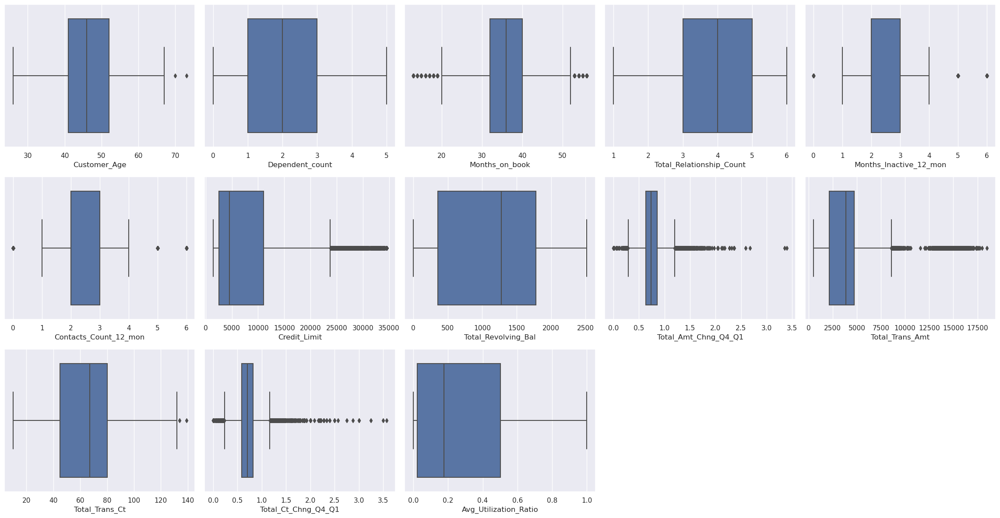

In [244]:
fig, ax = plt.subplots(3, 5, figsize=(23, 12))
ax = ax.flatten()

num_attrs = attrs["numerical"].copy()
num_attrs.remove("Avg_Open_To_Buy")

for i, col in enumerate(num_attrs):
    sns.boxplot(data=train_cp, x=col, ax=ax[i])

fig.delaxes(ax[-1])
fig.delaxes(ax[-2])
fig.tight_layout()

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'Unknown'),
  Text(1, 0, '$80K - $120K'),
  Text(2, 0, '$40K - $60K'),
  Text(3, 0, 'Less than $40K'),
  Text(4, 0, '$120K +'),
  Text(5, 0, '$60K - $80K')])

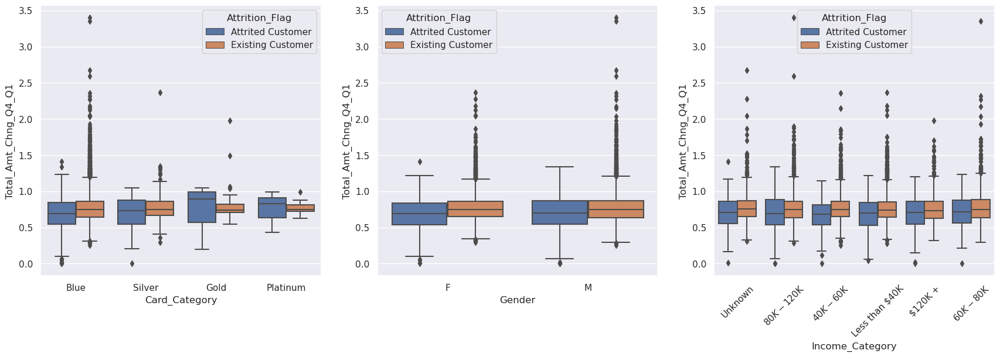

In [245]:
fig, ax = plt.subplots(1, 3, figsize=(21, 6))

sns.boxplot(data=train_cp, x="Card_Category", y="Total_Amt_Chng_Q4_Q1", hue="Attrition_Flag", ax=ax[0])
sns.boxplot(data=train_cp, x="Gender", y="Total_Amt_Chng_Q4_Q1", hue="Attrition_Flag", ax=ax[1])
sns.boxplot(data=train_cp, x="Income_Category", y="Total_Amt_Chng_Q4_Q1", hue="Attrition_Flag", ax=ax[2])
plt.xticks(rotation=45)

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'Unknown'),
  Text(1, 0, '$80K - $120K'),
  Text(2, 0, '$40K - $60K'),
  Text(3, 0, 'Less than $40K'),
  Text(4, 0, '$120K +'),
  Text(5, 0, '$60K - $80K')])

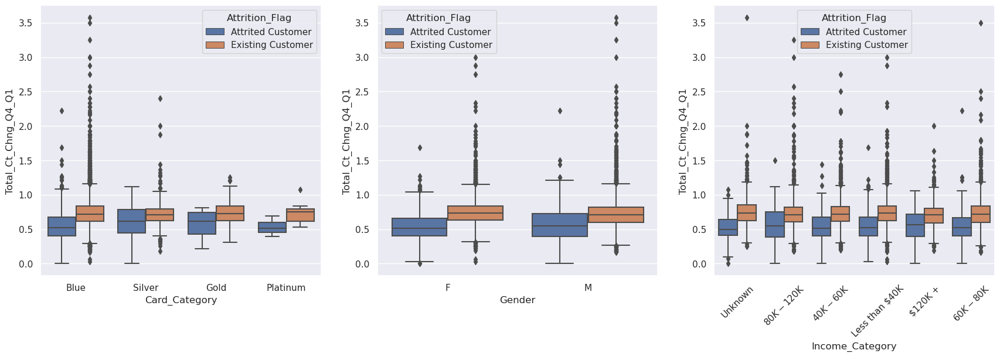

In [246]:
fig, ax = plt.subplots(1, 3, figsize=(21, 6))

sns.boxplot(data=train_cp, x="Card_Category", y="Total_Ct_Chng_Q4_Q1", hue="Attrition_Flag", ax=ax[0])
sns.boxplot(data=train_cp, x="Gender", y="Total_Ct_Chng_Q4_Q1", hue="Attrition_Flag", ax=ax[1])
sns.boxplot(data=train_cp, x="Income_Category", y="Total_Ct_Chng_Q4_Q1", hue="Attrition_Flag", ax=ax[2])
plt.xticks(rotation=45)

Možemo da vidimo da aktuelni korisnici u proseku imaju neznatno veću promenu transakcija u Q4 u odnosu na Q1.

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'Unknown'),
  Text(1, 0, '$80K - $120K'),
  Text(2, 0, '$40K - $60K'),
  Text(3, 0, 'Less than $40K'),
  Text(4, 0, '$120K +'),
  Text(5, 0, '$60K - $80K')])

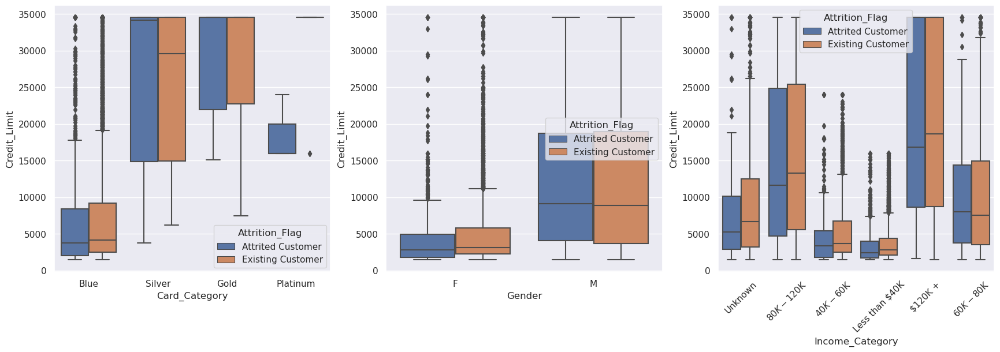

In [247]:
fig, ax = plt.subplots(1, 3, figsize=(21, 6))

sns.boxplot(data=train_cp, x="Card_Category", y="Credit_Limit", hue="Attrition_Flag", ax=ax[0])
sns.boxplot(data=train_cp, x="Gender", y="Credit_Limit", hue="Attrition_Flag", ax=ax[1])
sns.boxplot(data=train_cp, x="Income_Category", y="Credit_Limit", hue="Attrition_Flag", ax=ax[2])
plt.xticks(rotation=45)

Na osnovu ovog grafikona vidimo da svi korisnici koji nisu napustili banku, a koji imaju platinum karticu imaju maksimalan mogući limit (ili je unlimited). Svi korisnici sa platinum karticom koji su napustili banku imali su odredjeni limit na kartici.

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'Unknown'),
  Text(1, 0, '$80K - $120K'),
  Text(2, 0, '$40K - $60K'),
  Text(3, 0, 'Less than $40K'),
  Text(4, 0, '$120K +'),
  Text(5, 0, '$60K - $80K')])

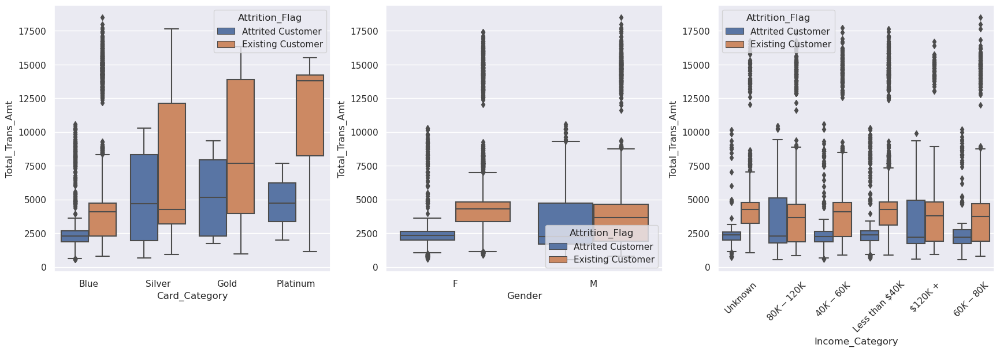

In [248]:
fig, ax = plt.subplots(1, 3, figsize=(21, 6))

sns.boxplot(data=train_cp, x="Card_Category", y="Total_Trans_Amt", hue="Attrition_Flag", ax=ax[0])
sns.boxplot(data=train_cp, x="Gender", y="Total_Trans_Amt", hue="Attrition_Flag", ax=ax[1])
sns.boxplot(data=train_cp, x="Income_Category", y="Total_Trans_Amt", hue="Attrition_Flag", ax=ax[2])
plt.xticks(rotation=45)

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'Unknown'),
  Text(1, 0, '$80K - $120K'),
  Text(2, 0, '$40K - $60K'),
  Text(3, 0, 'Less than $40K'),
  Text(4, 0, '$120K +'),
  Text(5, 0, '$60K - $80K')])

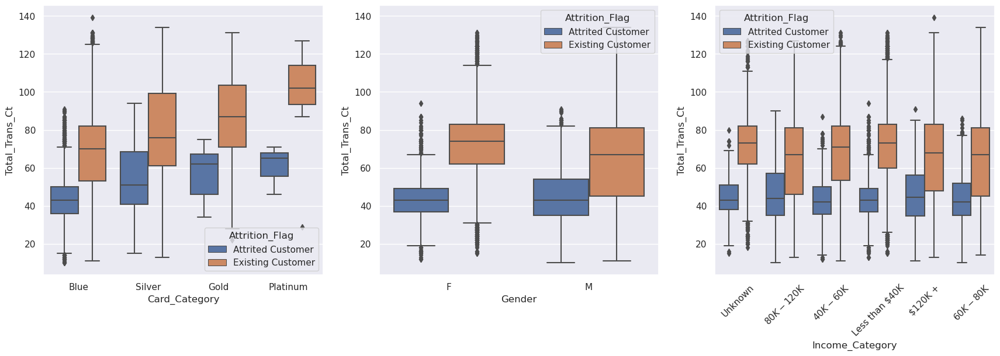

In [249]:
fig, ax = plt.subplots(1, 3, figsize=(21, 6))

sns.boxplot(data=train_cp, x="Card_Category", y="Total_Trans_Ct", hue="Attrition_Flag", ax=ax[0])
sns.boxplot(data=train_cp, x="Gender", y="Total_Trans_Ct", hue="Attrition_Flag", ax=ax[1])
sns.boxplot(data=train_cp, x="Income_Category", y="Total_Trans_Ct", hue="Attrition_Flag", ax=ax[2])
plt.xticks(rotation=45)

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'Unknown'),
  Text(1, 0, '$80K - $120K'),
  Text(2, 0, '$40K - $60K'),
  Text(3, 0, 'Less than $40K'),
  Text(4, 0, '$120K +'),
  Text(5, 0, '$60K - $80K')])

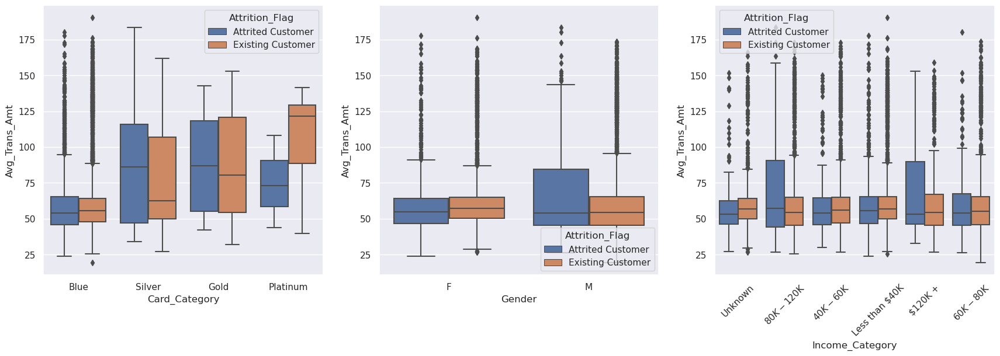

In [250]:
fig, ax = plt.subplots(1, 3, figsize=(21, 6))

sns.boxplot(data=train_cp, x="Card_Category", y="Avg_Trans_Amt", hue="Attrition_Flag", ax=ax[0])
sns.boxplot(data=train_cp, x="Gender", y="Avg_Trans_Amt", hue="Attrition_Flag", ax=ax[1])
sns.boxplot(data=train_cp, x="Income_Category", y="Avg_Trans_Amt", hue="Attrition_Flag", ax=ax[2])
plt.xticks(rotation=45)

Mozemo da vidimo da se raspodele numerickih atributa ne razlikuju bitnije za razlicite vrednosti kategorickih promenljivih (osim donekle za ***Card_Category*** atribut). Mada smo to i utvrdili ranije za ***Income_Category*** sada je to evidentno i za ***Gender***.<br>
Sa druge strane, postmatrali smo kako numericki atributi ***Total_Trans_Amt***, ***Total_Trans_Ct*** i nas novi ***Avg_Trans_Amt*** uticu na target atribut. Zakljuci su sledeci:
- Prosecna vrednost za ***Total_Trans_Amt*** raste sa kategorijom kartice za postojece korisnike (sto je i ocekivano). Ono sto je potencijalno interesantnije je podatak da za korisnike koji su napustili banku, nemamo drasticna povecanja za ovu vrednosti atributa za Silver, Gold i Platinum kartice.
- ***Total_Trans_Ct*** najbolje oslikava razliku u ponasanju izmedju postojecih korisnika i korisnika koji su napustili banku. Vrednost ovog atributa je veca je uvek u proseku veca za postojece korisnike. Takodje za Silver, Blue i Premium kartice korisnika koji su napustili banku, Total_Trans_Ct vrednost ne raste, kao sto je to slucaj za postojece korisnike, sto moze biti jos jedan bitan indikator. Takodje. nezavisno od pola i li kategorije prihoda, Total_Trans_Ct najbolje "razdvaja" obrasce ponasanja aktuelnih korisnika i korisnika koji su napustili banku.
- Na osnovu grafikona deluje da nas novi atribut ***Avg_Trans_Amt*** cak najlosije razdvaja aktuelne od bivsih korisnika, tako da cemo ga odbaciti, a trening cemo probati sa varijantama gde zadrzavamo oba atributa ***Total_Trans_Amt***, ***Total_Trans_Ct***, i gde koristimo samo ***Total_Trans_Ct***.


In [251]:
train_cp.drop("Avg_Trans_Amt", axis=1, inplace=True)

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'Unknown'),
  Text(1, 0, '$80K - $120K'),
  Text(2, 0, '$40K - $60K'),
  Text(3, 0, 'Less than $40K'),
  Text(4, 0, '$120K +'),
  Text(5, 0, '$60K - $80K')])

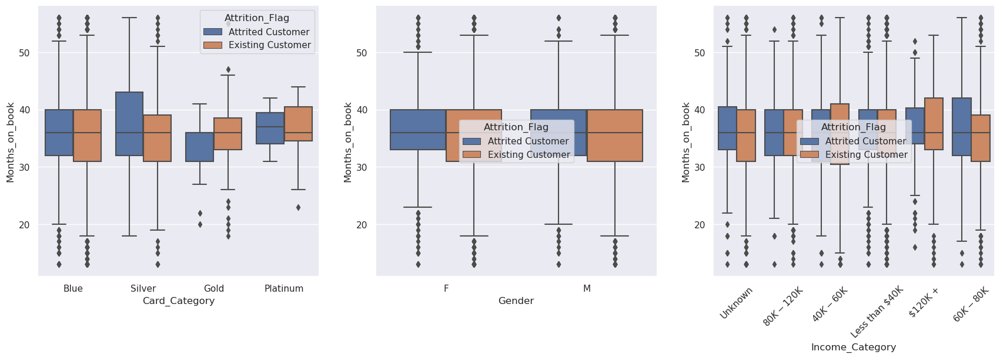

In [252]:
fig, ax = plt.subplots(1, 3, figsize=(21, 6))

sns.boxplot(data=train_cp, x="Card_Category", y="Months_on_book", hue="Attrition_Flag", ax=ax[0])
sns.boxplot(data=train_cp, x="Gender", y="Months_on_book", hue="Attrition_Flag", ax=ax[1])
sns.boxplot(data=train_cp, x="Income_Category", y="Months_on_book", hue="Attrition_Flag", ax=ax[2])
plt.xticks(rotation=45)

(array([0, 1, 2, 3, 4, 5]),
 [Text(0, 0, 'Unknown'),
  Text(1, 0, '$80K - $120K'),
  Text(2, 0, '$40K - $60K'),
  Text(3, 0, 'Less than $40K'),
  Text(4, 0, '$120K +'),
  Text(5, 0, '$60K - $80K')])

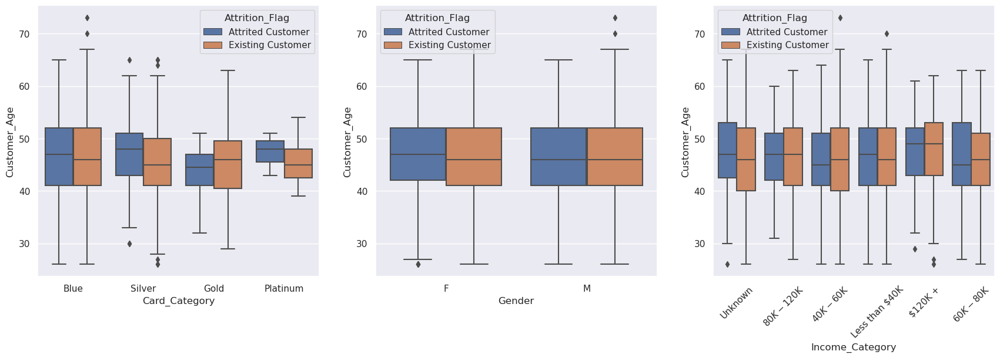

In [253]:
fig, ax = plt.subplots(1, 3, figsize=(21, 6))

sns.boxplot(data=train_cp, x="Card_Category", y="Customer_Age", hue="Attrition_Flag", ax=ax[0])
sns.boxplot(data=train_cp, x="Gender", y="Customer_Age", hue="Attrition_Flag", ax=ax[1])
sns.boxplot(data=train_cp, x="Income_Category", y="Customer_Age", hue="Attrition_Flag", ax=ax[2])
plt.xticks(rotation=45)

Ni *Months_on_book* ni *Customer_Age*, bitno ne razdvajaju postojece od bivsih korisnika. Kako su ova dva atributa visoko korelisana, zadrzacemo samo jedan. Iako *Months_on_book* atribut ima pomenuti problem sa ucestaloscu 36, intuitivno ovaj atribut daje bitnije informacije za nas problem, tako da atribut *Customer_Age* brisemo.

In [254]:
numerical = [attr for attr in train_cp.select_dtypes(include=["float64", "int64"]).columns]
numerical.remove("Customer_Age")

attrs = {
    "categorical": {
        "nominal": ["Gender"],
        "ordinal": ["Income_Category", "Card_Category"],
    },
    "numerical": numerical,
    "target": "Attrition_Flag"
}

attrs

{'categorical': {'nominal': ['Gender'],
  'ordinal': ['Income_Category', 'Card_Category']},
 'numerical': ['Dependent_count',
  'Months_on_book',
  'Total_Relationship_Count',
  'Months_Inactive_12_mon',
  'Contacts_Count_12_mon',
  'Credit_Limit',
  'Total_Revolving_Bal',
  'Total_Amt_Chng_Q4_Q1',
  'Total_Trans_Amt',
  'Total_Trans_Ct',
  'Total_Ct_Chng_Q4_Q1',
  'Avg_Utilization_Ratio'],
 'target': 'Attrition_Flag'}

Nakon ove analize, za detekciju outlier-a koristimo **LocalOutlierFactor** algoritam.<br>
<font color='green'>Ovaj algoritam računa LOF za svaku tačku podataka, u odnosu na njene susede (broj suseda se definiše hiperparametrom algoritma). Cilj je detektovati tačke koje imaju značajno manju LOF vrednost u odnosu na susede, što znači da se nalaze u oblastima sa manjom gustinom tačaka i samim tim predstavljaju outlier-e.</font>

In [255]:
income_categories = ["Unknown", "Less than $40K", "$40K - $60K", "$60K - $80K", "$80K - $120K", "$120K +"]
card_categories=["Blue", "Silver", "Gold", "Platinum"]

nominal_pipeline = pipeline.make_pipeline(preproc.OneHotEncoder(drop="if_binary"))
ordinal_pipeline = pipeline.make_pipeline(preproc.OrdinalEncoder(categories=[income_categories, card_categories]))

transformer = compose.ColumnTransformer([
    ("nominal_transformer", nominal_pipeline, attrs["categorical"]["nominal"]),
    ("ordinal_transformer", ordinal_pipeline, attrs["categorical"]["ordinal"])
], remainder="passthrough")


transformed_train_cp = transformer.fit_transform(train_cp.drop("Attrition_Flag", axis=1))

In [256]:
from sklearn.neighbors import LocalOutlierFactor

lof = LocalOutlierFactor(n_neighbors=3, contamination="auto")
y_pred = lof.fit_predict(transformed_train_cp)

In [257]:
train_cp["is_outlier"] = y_pred

In [258]:
train_cp["is_outlier"].value_counts()

is_outlier
 1    7804
-1     297
Name: count, dtype: int64

In [259]:
outliers_2d = pca.fit_transform(transformed_train_cp)
outliers_df = pd.DataFrame()
outliers_df["x"] = outliers_2d[:, 0]
outliers_df["y"] = outliers_2d[:, 1]
outliers_df["is_outlier"] = y_pred

<Axes: xlabel='x', ylabel='y'>

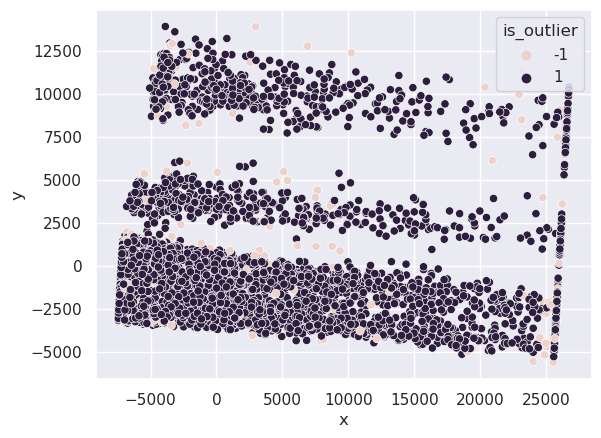

In [260]:
sns.scatterplot(data=outliers_df, x="x", y="y", hue="is_outlier")

In [261]:
train_cp[train_cp["is_outlier"] == -1]["Attrition_Flag"].value_counts()

Attrition_Flag
Existing Customer    204
Attrited Customer     93
Name: count, dtype: int64

In [262]:
train_no_outliers = train_cp[train_cp["is_outlier"] == 1]

In [263]:
train_outliers = train_cp[train_cp["is_outlier"] == -1]

Da bismo videli kako izgledaju ti outlieri koje smo izdvojili, pogledacemo raspodelu i njene parametre za numericke atribute u datasetu sa izbacenim outlierima i u originalnom datasetu.

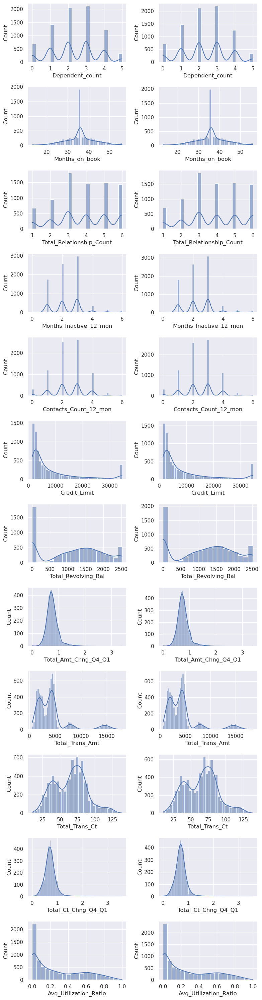

In [264]:
fig, ax = plt.subplots(len(attrs["numerical"]), 2, figsize=(8, 30))
for i, num_attr in enumerate(attrs["numerical"]):
    sns.histplot(data=train_no_outliers, x=num_attr, kde=True, ax=ax[i][0])
    sns.histplot(data=train_cp, x=num_attr, kde=True, ax=ax[i][1])

fig.tight_layout()

In [265]:
train_cp.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,is_outlier
count,8101.000000,8101.000000,8101.000000,8101.000000,8101.000000,8101.000000,8101.000000,8101.000000,8101.000000,8101.000000,8101.000000,8101.000000,8101.000000,8101.000000
mean,46.327120,2.350574,35.938279,3.820886,2.335514,2.449944,8636.210838,1162.422540,0.759994,4393.027034,64.752253,0.711916,0.274138,0.926676
std,7.985768,1.296832,7.957442,1.547005,1.002347,1.103919,9107.980541,814.680244,0.219483,3396.981611,23.486066,0.238334,0.274709,0.375885
min,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,0.000000,530.000000,10.000000,0.000000,0.000000,-1.000000
25%,41.000000,1.000000,32.000000,3.000000,2.000000,2.000000,2553.000000,357.000000,0.631000,2151.000000,45.000000,0.583000,0.023000,1.000000
50%,46.000000,2.000000,36.000000,4.000000,2.000000,2.000000,4549.000000,1279.000000,0.738000,3890.000000,67.000000,0.700000,0.176000,1.000000
75%,52.000000,3.000000,40.000000,5.000000,3.000000,3.000000,11067.000000,1781.000000,0.860000,4730.000000,80.000000,0.818000,0.503000,1.000000
max,73.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,3.397000,18484.000000,139.000000,3.571000,0.999000,1.000000


In [266]:
train_no_outliers.describe()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,is_outlier
count,7804.000000,7804.000000,7804.000000,7804.000000,7804.000000,7804.000000,7804.000000,7804.000000,7804.000000,7804.000000,7804.000000,7804.000000,7804.000000,7804.0
mean,46.327268,2.347514,35.927858,3.827909,2.334444,2.444259,8541.585648,1176.292542,0.760287,4374.956817,64.775372,0.712569,0.278572,1.0
std,7.978008,1.296766,7.956069,1.545329,1.004354,1.102393,8973.249199,808.021070,0.220203,3366.203408,23.364897,0.238335,0.274872,0.0
min,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,0.000000,530.000000,10.000000,0.000000,0.000000,1.0
25%,41.000000,1.000000,32.000000,3.000000,2.000000,2.000000,2557.750000,536.500000,0.630000,2153.750000,45.000000,0.583000,0.030000,1.0
50%,46.000000,2.000000,36.000000,4.000000,2.000000,2.000000,4548.500000,1293.000000,0.738000,3889.000000,67.000000,0.700000,0.183000,1.0
75%,52.000000,3.000000,40.000000,5.000000,3.000000,3.000000,10880.500000,1784.000000,0.860000,4718.250000,80.000000,0.818000,0.511000,1.0
max,73.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,3.397000,17995.000000,139.000000,3.571000,0.999000,1.0


Iako su razlike neznatne, sto je i donekle ocekivano obzirom da je izbacen mali procenat vrsta (samo ~300/8000), ali vidimo da je za atribute *Total_Trans_Amt* izbacena najveca vrednost 18484. U narednoj sekciji mozemo da vidimo da je ovaj atribut od velike vaznosti za klasifikaciju. Zbog ovakvih detalja cemo najbolje modele na kraju testirati i nad train_no_outliers datasetu.

<font color='magenta'>**Rezime:**
- Brišemo kolone *Marital_Status* i *Education_Level*, zbog dosta nedostajućih vrednosti - analizom je utvrđeno da ovi atributi ne utiču značajno na klasfikaciju.
- Brišemo kolonu *Avg_Open_To_Buy* zbog potpune linearne korelacije (1) sa atributom *Credit_Limit*.
- Nedostajuće vrednosti u koloni *Income_Category* popunjavamo korišćenjem IterativeImputer-a, koji popunjava nedostajuće vrednosti na osnovu drugih atributa vrste. IterativeImputer koristi ostale atribute kao predictore dok atribut sa nedostajućim vrednostima tretira kao target, koji popunjava korišćenjem modela klasifikacije.
- Zbog visoke linearne korelacije sa *Customer_Age*, brisemo atribut *Months_on_book*.
- Outliere detektujemo korišćenjem **LocalOutlierFactor** algoritma, koji kao outliere detektuje tačke u prostoru sa manjom gustinom tačaka u okolini u odnosu na gustinu tačaka u okolini njenih najbližih suseda. Zbog prirode problema, tj. zbog velikog disbalansa target klase, modeli koji se testiraju u nastavku će biti trenirani na originalnom datasetu (sa svim vrstama), kao i na datasetu sa izbačenim outlier-ima. Razlog tome je upravo što outlieri mogu biti značajni za detekciju manjinske klase (upravo outlieri mogu biti događaj od interesa, tj. korisnici koji imaju tendenciju da napuste banku).

</font>

### Vaznost atributa

In [267]:
dataset = train_cp.drop(["is_outlier"], axis=1).copy(deep=True)
dataset.shape

(8101, 17)

In [268]:
dataset.replace(to_replace="Unknown", value=np.nan, inplace=True)

In [269]:
dataset.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
1602,Attrited Customer,54,F,3,NaN,Blue,49,6,2,3,13184.0,0,1.166,2047,33,0.179,0.000
7791,Existing Customer,51,M,0,$80K - $120K,Blue,45,3,2,3,10648.0,2517,0.708,4930,89,0.978,0.236
7177,Existing Customer,45,F,4,$40K - $60K,Blue,29,3,2,1,4595.0,1781,0.708,3746,68,0.545,0.388
97,Existing Customer,53,M,3,$40K - $60K,Blue,35,5,3,2,3789.0,1706,1.047,1609,42,0.680,0.450
4820,Existing Customer,48,F,2,NaN,Blue,40,3,2,4,5104.0,736,0.679,3943,78,0.696,0.144


In [270]:
income_categories = ["Less than $40K", "$40K - $60K", "$60K - $80K", "$80K - $120K", "$120K +"]
card_categories=["Blue", "Silver", "Gold", "Platinum"]

nominal_pipeline = pipeline.make_pipeline(preproc.OneHotEncoder(drop="if_binary", sparse_output=False))
ordinal_pipeline = pipeline.make_pipeline(preproc.OrdinalEncoder(categories=[income_categories, card_categories], handle_unknown="use_encoded_value", unknown_value=-1, dtype=np.int64))

transformer = compose.ColumnTransformer([
    ("nominal_transformer", nominal_pipeline, attrs["categorical"]["nominal"]),
    ("ordinal_transformer", ordinal_pipeline, attrs["categorical"]["ordinal"])
], remainder="passthrough").set_output(transform="pandas")

imputer = IterativeImputer(missing_values=-1, random_state=42, initial_strategy="most_frequent", max_iter=50).set_output(transform="pandas")

pipe = pipeline.make_pipeline(transformer, imputer)

In [271]:
transformed_dataset = pipe.fit_transform(dataset.drop(["Attrition_Flag"], axis=1))

In [272]:
transformed_dataset["ordinal_transformer__Income_Category"] = transformed_dataset["ordinal_transformer__Income_Category"].apply(lambda x: np.rint(x))

In [273]:
label_encoder = preproc.LabelEncoder()
target = label_encoder.fit_transform(dataset["Attrition_Flag"])

In [274]:
from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier(n_estimators=200, random_state=42)
rfc.fit(transformed_dataset, target)

RandomForestClassifier(n_estimators=200, random_state=42)

In [275]:
f_importances_rf = sorted(list(zip(rfc.feature_importances_, rfc.feature_names_in_)), key=lambda x: x[0], reverse=True)

[Text(0, 0, 'remainder__Total_Trans_Amt'),
 Text(1, 0, 'remainder__Total_Trans_Ct'),
 Text(2, 0, 'remainder__Total_Revolving_Bal'),
 Text(3, 0, 'remainder__Total_Ct_Chng_Q4_Q1'),
 Text(4, 0, 'remainder__Total_Relationship_Count'),
 Text(5, 0, 'remainder__Total_Amt_Chng_Q4_Q1'),
 Text(6, 0, 'remainder__Avg_Utilization_Ratio'),
 Text(7, 0, 'remainder__Credit_Limit'),
 Text(8, 0, 'remainder__Customer_Age'),
 Text(9, 0, 'remainder__Months_on_book'),
 Text(10, 0, 'remainder__Contacts_Count_12_mon'),
 Text(11, 0, 'remainder__Months_Inactive_12_mon'),
 Text(12, 0, 'remainder__Dependent_count'),
 Text(13, 0, 'ordinal_transformer__Income_Category'),
 Text(14, 0, 'nominal_transformer__Gender_M'),
 Text(15, 0, 'ordinal_transformer__Card_Category')]

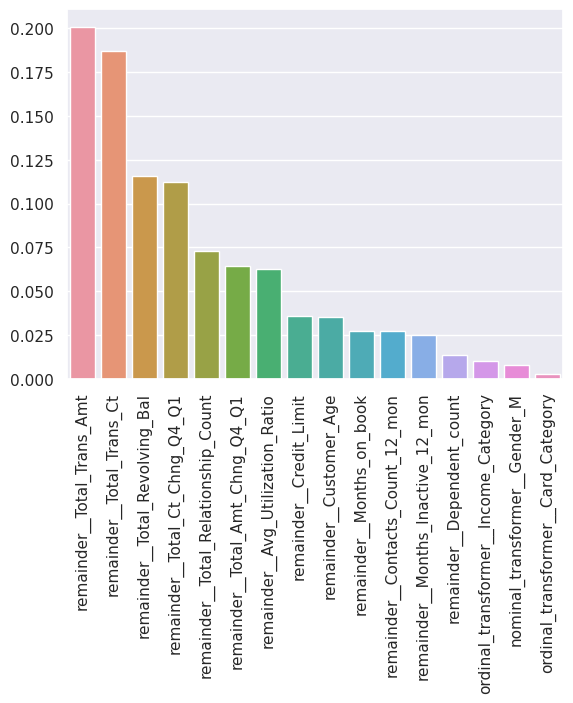

In [276]:
p = sns.barplot(x=list(map(lambda x: x[1], f_importances_rf)), y=list(map(lambda x: x[0], f_importances_rf)))
p.set_xticklabels(labels=p.get_xticklabels(), rotation=90)

Korišćenjem atributa ***feature_importances*** RandomForest klasifikatora, možemo da vidimo koji su atributi važniji, a koji manje važni za ispravnu klasifikaciju (iz ugla RandomForest modela).

## Treniranje modela

In [277]:
train.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
1602,Attrited Customer,54,F,3,College,Single,Unknown,Blue,49,6,2,3,13184.0,0,13184.0,1.166,2047,33,0.179,0.000
7791,Existing Customer,51,M,0,High School,Single,$80K - $120K,Blue,45,3,2,3,10648.0,2517,8131.0,0.708,4930,89,0.978,0.236
7177,Existing Customer,45,F,4,High School,Single,$40K - $60K,Blue,29,3,2,1,4595.0,1781,2814.0,0.708,3746,68,0.545,0.388
97,Existing Customer,53,M,3,Doctorate,Married,$40K - $60K,Blue,35,5,3,2,3789.0,1706,2083.0,1.047,1609,42,0.680,0.450
4820,Existing Customer,48,F,2,Graduate,Married,Unknown,Blue,40,3,2,4,5104.0,736,4368.0,0.679,3943,78,0.696,0.144


In [278]:
test.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
9242,Existing Customer,47,M,3,Graduate,Single,$60K - $80K,Silver,36,1,1,2,30498.0,1990,28508.0,0.839,16202,120,0.791,0.065
7036,Existing Customer,51,M,1,High School,Married,Less than $40K,Blue,41,3,4,3,1438.3,0,1438.3,0.623,4312,81,0.723,0.000
914,Existing Customer,55,M,2,College,Married,$80K - $120K,Blue,45,5,1,2,2929.0,2431,498.0,1.632,1903,39,0.625,0.830
9681,Existing Customer,40,F,4,Uneducated,Married,Unknown,Blue,29,2,3,3,3326.0,2181,1145.0,0.827,13583,110,0.746,0.656
9026,Attrited Customer,62,M,1,High School,Single,$60K - $80K,Blue,46,2,3,3,7547.0,2477,5070.0,1.021,5294,73,0.698,0.328


In [279]:
numerical = [attr for attr in train_cp.select_dtypes(include=["float64", "int64"]).columns]

attrs = {
    "categorical": {
        "nominal": ["Gender"],
        "ordinal": ["Income_Category", "Card_Category"],
    },
    "numerical": numerical,
    "target": "Attrition_Flag"
}

attrs

{'categorical': {'nominal': ['Gender'],
  'ordinal': ['Income_Category', 'Card_Category']},
 'numerical': ['Customer_Age',
  'Dependent_count',
  'Months_on_book',
  'Total_Relationship_Count',
  'Months_Inactive_12_mon',
  'Contacts_Count_12_mon',
  'Credit_Limit',
  'Total_Revolving_Bal',
  'Total_Amt_Chng_Q4_Q1',
  'Total_Trans_Amt',
  'Total_Trans_Ct',
  'Total_Ct_Chng_Q4_Q1',
  'Avg_Utilization_Ratio',
  'is_outlier'],
 'target': 'Attrition_Flag'}

In [280]:
income_categories = ["Less than $40K", "$40K - $60K", "$60K - $80K", "$80K - $120K", "$120K +"]
card_categories=["Blue", "Silver", "Gold", "Platinum"]

nominal_pipeline = pipeline.make_pipeline(preproc.OneHotEncoder(drop="if_binary", sparse_output=False))
ordinal_pipeline = pipeline.make_pipeline(preproc.OrdinalEncoder(categories=[income_categories, card_categories], handle_unknown="use_encoded_value", unknown_value=-1, dtype=np.int64))
num_scaling_pipeline = pipeline.make_pipeline(preproc.StandardScaler())

selector = compose.ColumnTransformer([
    ("selector", "drop", ["Avg_Open_To_Buy", "Marital_Status", "Education_Level", "Customer_Age"])
], remainder="passthrough", n_jobs=-1, verbose_feature_names_out=False).set_output(transform="pandas")

transformer = compose.ColumnTransformer([
    ("nominal_transformer", nominal_pipeline, attrs["categorical"]["nominal"]),
    ("ordinal_transformer", ordinal_pipeline, attrs["categorical"]["ordinal"]),
    ("num_scaler", num_scaling_pipeline, ["Credit_Limit", "Total_Revolving_Bal", "Total_Trans_Amt", "Total_Trans_Ct", "Months_on_book"])
], remainder="passthrough", n_jobs=-1)

imputer = IterativeImputer(missing_values=-1, random_state=42, initial_strategy="most_frequent", max_iter=50)

pipe = pipeline.make_pipeline(selector, transformer, imputer)
target_enc = preproc.LabelEncoder()

Ovaj pipeline ćemo koristiti u nastavku za transformaciju train i test podataka.

In [281]:
n_splits = 5
kf = model_selection.StratifiedKFold(n_splits=n_splits, random_state=42, shuffle=True)
scoring = {"precision": "precision", "recall": "recall", "f1": "f1_weighted", "acc": "accuracy", "pr": "average_precision", "auc": "roc_auc"}

In [282]:
X_train = train.drop(["Attrition_Flag"], axis=1)
y_train = train["Attrition_Flag"]
X_test = test.drop(["Attrition_Flag"], axis=1)
y_test = test["Attrition_Flag"]

print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)
print("Odnos klasa y_train:", y_train.value_counts())
print("Odnos klasa y_test:", y_test.value_counts())

(8101, 19)
(8101,)
(2026, 19)
(2026,)
Odnos klasa y_train: Attrition_Flag
Existing Customer    6799
Attrited Customer    1302
Name: count, dtype: int64
Odnos klasa y_test: Attrition_Flag
Existing Customer    1701
Attrited Customer     325
Name: count, dtype: int64


In [283]:
X_train.head()

,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
1602,54,F,3,College,Single,Unknown,Blue,49,6,2,3,13184.0,0,13184.0,1.166,2047,33,0.179,0.000
7791,51,M,0,High School,Single,$80K - $120K,Blue,45,3,2,3,10648.0,2517,8131.0,0.708,4930,89,0.978,0.236
7177,45,F,4,High School,Single,$40K - $60K,Blue,29,3,2,1,4595.0,1781,2814.0,0.708,3746,68,0.545,0.388
97,53,M,3,Doctorate,Married,$40K - $60K,Blue,35,5,3,2,3789.0,1706,2083.0,1.047,1609,42,0.680,0.450
4820,48,F,2,Graduate,Married,Unknown,Blue,40,3,2,4,5104.0,736,4368.0,0.679,3943,78,0.696,0.144


In [284]:
y_train

1602    Attrited Customer
7791    Existing Customer
7177    Existing Customer
97      Existing Customer
4820    Existing Customer
              ...        
6821    Existing Customer
6178    Existing Customer
2544    Existing Customer
4945    Existing Customer
3640    Existing Customer
Name: Attrition_Flag, Length: 8101, dtype: object

In [285]:
y_train_t = target_enc.fit_transform(y_train)
y_test_t = target_enc.transform(y_test)

<font color='pink'>
Akcenat u ovom projektu je na ansambl modelima, koji nisu zasnovani na stablima odlučivanja.<br>
Kao adekvatni primeri demonstrirani različiti modeli koji su deo **scikit-learn** biblioteke, od kojih svaki od njih rešava različite probleme koji se mogu javiti. To su:

- <font color='cyan'>**VotingClassifier**</font> - Ideja ovog klasifikatora je da iskombinuje predikcije više različitih osnovnih modela na osnovu većinskog glasanja, ili ponderisanog proseka (weighted average) verovatnoća svakog od modela. Ovakav klasifikator može poboljšati rezultate klasifikacije jer se glasanjem mogu "prikriti" određeni nedostaci individualnih modela. (Potrebno je da individualni modeli sami po sebi budu dovoljno dobri kako bi i konačni rezultati imali smisla, naročito u slučaju većinskog glasanja).
- <font color='cyan'>**BaggingClassifier**</font> - Ansambl metoda koja koristi više instanci definisanog osnovnog modela, kako bi se smanjila varijansa modela, tj. sprečio overfitting. Ovaj klasifikator to postiže tako što se svaka instanca osnovnog modela trenira na različitom podskupu početnog dataseta, što dovodi do bolje generalizacije. Podskup početnog dataseta može biti podskup vrsta, podskup atributa, ili podskup i atributa i vrsta. Prilikom izbora vrsta koristi se uzorkovanje sa zamenom.
- <font color='cyan'>**StackingClassifier**</font> - StackingClassifier se, za razliku od BaggingClassifera koristi da rezultate većeg broja prostijih modela poveže tako da smanji bias svakog od njih, tj. da bi se sprečio underfitting. Ideja je da se rezultati klasifikacije (ili verovatnoće) svakog prostijeg modela dovedu kao ulaz finalnog estiamtora, koji zatim vrši klasifikaciju.
- <font color='cyan'>**AdaBoost**</font> - Specifičan primer klasifikatora koji koristi veliki broj *slabih klasifikatora (Weak Learners)* koji se treniraju u više iteracija, nad različitim podskupovima početnog dataseta. U svakoj novoj iteraciji se ažuriraju težine vrsta dataseta, tako da se vrste koje su prethodno pogrešno klasifikovane imaju veću verovatnoću da budu izabrane. Ovakvim pristupom se forsira bolje prilagođavanje klasifikatora primerima koji su teži za klasifikaciju. Inicijalno, svaki individualni slabi klasifikator ima neznatno bolje performase klasifikacije od dummy klasifikatora (neznatno preko 50%).

</font>

In [286]:
biased_models = {
    "lreg": LogisticRegression(penalty='l1', C=1e-3, solver="liblinear", max_iter=200, class_weight="balanced", n_jobs=-1),
    "svm": LinearSVC(penalty="l1", class_weight="balanced", C=1e-3, dual=False),
    "stump_tree": DecisionTreeClassifier(max_depth=1, random_state=42)
}

h_var_models = {
    "lreg": LogisticRegression(penalty=None, solver="newton-cholesky", max_iter=500, class_weight="balanced", n_jobs=-1),
    "svm": SVC(kernel="poly", degree=20, class_weight="balanced", C=1e4, random_state=42),
    "knn": KNeighborsClassifier(n_neighbors=1, n_jobs=-1),
}

balanced_models = {
    "lreg": LogisticRegression(penalty="l2", solver="liblinear", max_iter=500, class_weight="balanced", n_jobs=-1),
    "svm": SVC(kernel="rbf", class_weight="balanced", C=1e-2, random_state=42, probability=True),
    "knn": KNeighborsClassifier(n_neighbors=7),
}

In [287]:
results_b = dict()

for model in biased_models:
    results_b[model] = run_cv(biased_models[model], X_train, y_train_t, pipe, kf, scoring=scoring, train_score=True)

In [288]:
display_results(results_b, scoring, with_std=False)

,train_precision_avg,test_precision_avg,train_recall_avg,test_recall_avg,train_f1_avg,test_f1_avg,train_acc_avg,test_acc_avg,train_pr_avg,test_pr_avg,train_auc_avg,test_auc_avg
lreg,0.961588,0.960705,0.735402,0.736431,0.783764,0.783850,0.753271,0.753485,0.961136,0.961079,0.820712,0.820467
svm,0.960156,0.959540,0.779747,0.779672,0.811886,0.811328,0.787989,0.787432,0.972134,0.972000,0.881518,0.880868
stump_tree,0.839279,0.839279,1.000000,1.000000,0.765941,0.765941,0.839279,0.839279,0.925099,0.924536,0.779664,0.777895


In [289]:
results_v = dict()

for model in h_var_models:
    results_v[model] = run_cv(h_var_models[model], X_train, y_train_t, pipe, kf, scoring=scoring, train_score=True)

In [290]:
display_results(results_v, scoring, with_std=False)

,train_precision_avg,test_precision_avg,train_recall_avg,test_recall_avg,train_f1_avg,test_f1_avg,train_acc_avg,test_acc_avg,train_pr_avg,test_pr_avg,train_auc_avg,test_auc_avg
lreg,0.967202,0.966065,0.846889,0.845564,0.861042,0.859297,0.847395,0.845450,0.984337,0.983834,0.927127,0.925238
svm,0.997652,0.935947,0.999963,0.909395,0.997989,0.875321,0.997994,0.871743,0.999999,0.940461,0.999996,0.815395
knn,1.000000,0.930918,1.000000,0.938961,1.000000,0.889185,1.000000,0.890261,1.000000,0.925319,1.000000,0.787475


In [291]:
results_normal = dict()

for model in balanced_models:
    results_normal[model] = run_cv(balanced_models[model], X_train, y_train_t, pipe, kf, scoring=scoring, train_score=True)

In [292]:
display_results(results_normal, scoring, with_std=False)

,train_precision_avg,test_precision_avg,train_recall_avg,test_recall_avg,train_f1_avg,test_f1_avg,train_acc_avg,test_acc_avg,train_pr_avg,test_pr_avg,train_auc_avg,test_auc_avg
lreg,0.967201,0.965942,0.846852,0.846593,0.861016,0.859888,0.847365,0.846190,0.984329,0.983847,0.927124,0.925305
svm,0.955589,0.954965,0.841080,0.841152,0.848325,0.847825,0.833817,0.833354,0.974575,0.973994,0.896067,0.893977
knn,0.938510,0.926295,0.981541,0.974112,0.926587,0.907584,0.930533,0.913220,0.991892,0.970168,0.970030,0.910141


Sada cemo koristiti pomenute modele ucenja u ansamblu i razmotricemo rezultate:

### VotingClassifier

In [ ]:
voting_estimators = list(zip(list(balanced_models.keys()), list(balanced_models.values())))
voting = VotingClassifier(estimators=voting_estimators, voting="soft", weights=[1.5, 1, 3.0], n_jobs=-1)

results_voting = run_cv(voting, X_train, y_train_t, pipe, kf, scoring=scoring, train_score=True)

In [517]:
display_results({"voting": results_voting}, scoring, with_std=False)

,train_precision_avg,test_precision_avg,train_recall_avg,test_recall_avg,train_f1_avg,test_f1_avg,train_acc_avg,test_acc_avg,train_pr_avg,test_pr_avg,train_auc_avg,test_auc_avg
voting,0.947369,0.937657,0.97029,0.966316,0.927878,0.91487,0.929823,0.917787,0.993143,0.986897,0.965496,0.941451


Mozemo da primetimo da su sve metrike modela (test metrike, tj. rezultati validacije), bolji od svih individualnih biased modela.

Sada cemo probati da nadjemo optimalne hiperparametre, kako za tezine kojima se mnoze rezultati individualnih modela u VotingClassifier-u, tako i za individualne estimatore. Zbog velikog broja potencijalnih kombinacija, koristicemo **RandomizedSerach**.<br>
**Napomena**: Za ocenjivanje najboljeg modela koriscenjem RandomizedSerach metode, potrebno je izabrati metriku. Kako accuracy, i roc_auc_score nisu najbolje metrike za rad sa nebalansiranim datasetovima, mozemo da koristimo neku od sledecih metrika: precision_at_recall, precision, recall, f1-score. Kako mi nedostaje domenskog znanja, nije najjasnije da li je precission ili recall bitnija metrika (Npr. ukoliko banka zeli po svaku cenu da zadrzi sto vise korisnika, recall je bitniji. Sa druge strane, potrebno je imati i dovoljno dobar precission, jer u slucaju da imamo previse lazno pozitivnih klasifikacija, to moze dovesti do finansijskih gubitaka - jer banka mozda klijentu nudi neke pogodnosti kako je on ne bi napustio, a pritom klijent nije to ni nameravao). Usled navedene problematike, koristicemo F1-score metriku, koja predstavlja harmonijsku sredinu ove dve metrike.

#### Osnovni podaci

In [522]:
np.random.seed(42)

hyperparam_grid = {
    "votingclassifier__weights": [uniform(0.0, 5.0).rvs(len(voting_estimators))],
    "votingclassifier__lreg__C": uniform(0.0, 1e4),
    "votingclassifier__svm__C": uniform(0.0, 1e4),
    "votingclassifier__knn__n_neighbors": [5, 7, 9, 11, 13, 15]
}

X_train_copy = X_train.copy(deep=True)
y_train_t_copy = np.copy(y_train_t)

random_search = RandomizedSearchCV(estimator=pipeline.make_pipeline(pipe, voting), param_distributions=hyperparam_grid, cv=kf,
                                   scoring="f1_weighted", n_iter=200, refit=True, n_jobs=-1, random_state=42, verbose=1)

random_search.fit(X_train_copy, y_train_t_copy)

Fitting 5 folds for each of 200 candidates, totalling 1000 fits


/home/uros/miniconda3/envs/data_mining/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1222: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 16.
  warnings.warn(


RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
                   estimator=Pipeline(steps=[('pipeline',
                                              Pipeline(steps=[('columntransformer-1',
                                                               ColumnTransformer(n_jobs=-1,
                                                                                 remainder='passthrough',
                                                                                 transformers=[('selector',
                                                                                                'drop',
                                                                                                ['Avg_Open_To_Buy',
                                                                                                 'Marital_Status',
                                                                                                 'Education_Level',
                                                                                                 'Customer_Age'])],
                                                                                 verbose_feature_names_out=False)),
                                                              ('c...
                   param_distributions={'votingclassifier__knn__n_neighbors': [5,
                                                                               7,
                                                                               9,
                                                                               11,
                                                                               13,
                                                                               15],
                                        'votingclassifier__lreg__C': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x7abecc6444f0>,
                                        'votingclassifier__svm__C': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x7abecc6b5160>,
                                        'votingclassifier__weights': [array([1.87270059, 4.75357153, 3.65996971])]},
                   random_state=42, scoring='f1_weighted', verbose=1)

In [523]:
print(f'Najbolji F1 score iznosi {np.round(random_search.best_score_, 3)} i dostize se za sledece parametre\n{random_search.best_params_}')

Najbolji F1 score iznosi 0.932 i dostize se za sledece parametre
{'votingclassifier__knn__n_neighbors': 5, 'votingclassifier__lreg__C': 1987.156815341724, 'votingclassifier__svm__C': 55.22117123602399, 'votingclassifier__weights': array([1.87270059, 4.75357153, 3.65996971])}


In [524]:
best_voting_classifier = random_search.best_estimator_
best_voting_classifier

Pipeline(steps=[('pipeline',
                 Pipeline(steps=[('columntransformer-1',
                                  ColumnTransformer(n_jobs=-1,
                                                    remainder='passthrough',
                                                    transformers=[('selector',
                                                                   'drop',
                                                                   ['Avg_Open_To_Buy',
                                                                    'Marital_Status',
                                                                    'Education_Level',
                                                                    'Customer_Age'])],
                                                    verbose_feature_names_out=False)),
                                 ('columntransformer-2',
                                  ColumnTransformer(n_jobs=-1,
                                                    remainder='passthrough',
                                                    transformers=[('n...
                ('votingclassifier',
                 VotingClassifier(estimators=[('lreg',
                                               LogisticRegression(C=1987.156815341724,
                                                                  class_weight='balanced',
                                                                  max_iter=500,
                                                                  n_jobs=-1,
                                                                  solver='liblinear')),
                                              ('svm',
                                               SVC(C=55.22117123602399,
                                                   class_weight='balanced',
                                                   probability=True,
                                                   random_state=42)),
                                              ('knn', KNeighborsClassifier())],
                                  n_jobs=-1, voting='soft',
                                  weights=array([1.87270059, 4.75357153, 3.65996971])))])

In [525]:
y_pred_voting = best_voting_classifier.predict(X_test.copy(deep=True))

              precision    recall  f1-score   support

           0       0.80      0.75      0.77       325
           1       0.95      0.96      0.96      1701

    accuracy                           0.93      2026
   macro avg       0.88      0.86      0.87      2026
weighted avg       0.93      0.93      0.93      2026



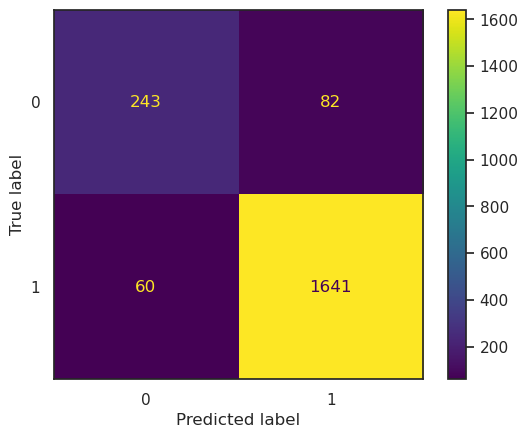

In [526]:
print(sklearn.metrics.classification_report(y_test_t, y_pred_voting))
confusion_matrix = sklearn.metrics.confusion_matrix(y_test_t, y_pred_voting)
cmd = sklearn.metrics.ConfusionMatrixDisplay(confusion_matrix)
sns.set_style("white")
cmd.plot()

Vidimo da rezultati nisu losi, medjutim za klasu koja je u manjini, imamo dosta vise lose predvidjenih primera. Zbog toga cemo probati tehnike Oversamplinga koriscenjem **imbalanced-learn** biblioteke. Koristicemo ***SMOTE*** oversampling, koji funkcionise tako sto trazi najblize susede za klase minority klase, i iz svake grupe suseda bira par tacaka minority klase, provlaci "pravu" (pod navodnicima, jer se ovo desava u visedimenzionalnom prostoru - znaci zapravo provlaci neku hiperravan) i duz te prave interpolacijom generise novi fiktivni primerak nase klase. Ovaj algoritam funkcionise bolje od Random oversamplinga, jer je glavna ideja da novi primerci klase budu verodostojniji, tj. slicni postojecim primercima minority klase.

#### SMOTE

In [ ]:
results_voting_resampled = run_cv(voting, X_train, y_train_t, pipe, kf, resampled=True, scoring=scoring, train_score=True)

In [339]:
display_results({"voting_resampled": results_voting_resampled}, scoring, with_std=False)

,train_precision_avg,test_precision_avg,train_recall_avg,test_recall_avg,train_f1_avg,test_f1_avg,train_acc_avg,test_acc_avg,train_pr_avg,test_pr_avg,train_auc_avg,test_auc_avg
voting_resampled,0.978925,0.970444,0.875938,0.868215,0.88964,0.877806,0.880046,0.867176,0.990009,0.984743,0.95292,0.932783


Probacemo da nadjemo optimalne hiperparametre i za SMOTE objekat.

In [ ]:
np.random.seed(42)

hyperparam_grid = {
    "votingclassifier__weights": [uniform(0.0, 5.0).rvs(len(voting_estimators))],
    "votingclassifier__lreg__C": uniform(0.0, 1e3),
    "votingclassifier__svm__C": uniform(0.0, 1e3),
    "votingclassifier__knn__n_neighbors": [7, 9, 11, 13],
    "smote__k_neighbors": [3, 5, 7, 9],
    "smote__sampling_strategy": uniform(0.3, 1.0)
}

oversampler = imblearn.over_sampling.SMOTE(sampling_strategy=0.6, random_state=42, k_neighbors=5, n_jobs=-1)

X_train_copy = X_train.copy(deep=True)
y_train_t_copy = np.copy(y_train_t)

random_search_resampled = RandomizedSearchCV(estimator=imblearn.pipeline.make_pipeline(*list(pipe.named_steps.values()), oversampler, voting), param_distributions=hyperparam_grid, cv=kf,
                                   scoring="f1_weighted", n_iter=200, refit=True, n_jobs=-1, random_state=42, verbose=1)

random_search_resampled.fit(X_train_copy, y_train_t_copy)

In [528]:
print(f'Najbolji F1 score iznosi {np.round(random_search_resampled.best_score_, 3)} i dostize se za sledece parametre\n{random_search_resampled.best_params_}')

Najbolji F1 score iznosi 0.934 i dostize se za sledece parametre
{'smote__k_neighbors': 3, 'smote__sampling_strategy': 0.3156364067411939, 'votingclassifier__knn__n_neighbors': 7, 'votingclassifier__lreg__C': 772.2447692966574, 'votingclassifier__svm__C': 198.7156815341724, 'votingclassifier__weights': array([1.87270059, 4.75357153, 3.65996971])}


In [529]:
best_voting_classifier_resampled = random_search_resampled.best_estimator_
best_voting_classifier_resampled

Pipeline(steps=[('columntransformer-1',
                 ColumnTransformer(n_jobs=-1, remainder='passthrough',
                                   transformers=[('selector', 'drop',
                                                  ['Avg_Open_To_Buy',
                                                   'Marital_Status',
                                                   'Education_Level',
                                                   'Customer_Age'])],
                                   verbose_feature_names_out=False)),
                ('columntransformer-2',
                 ColumnTransformer(n_jobs=-1, remainder='passthrough',
                                   transformers=[('nominal_transformer',
                                                  Pipeline...
                 VotingClassifier(estimators=[('lreg',
                                               LogisticRegression(C=772.2447692966574,
                                                                  class_weight='balanced',
                                                                  max_iter=500,
                                                                  n_jobs=-1,
                                                                  solver='liblinear')),
                                              ('svm',
                                               SVC(C=198.7156815341724,
                                                   class_weight='balanced',
                                                   probability=True,
                                                   random_state=42)),
                                              ('knn',
                                               KNeighborsClassifier(n_neighbors=7))],
                                  n_jobs=-1, voting='soft',
                                  weights=array([1.87270059, 4.75357153, 3.65996971])))])

In [530]:
y_pred_voting_resampled = best_voting_classifier_resampled.predict(X_test.copy(deep=True))

              precision    recall  f1-score   support

           0       0.78      0.80      0.79       325
           1       0.96      0.96      0.96      1701

    accuracy                           0.93      2026
   macro avg       0.87      0.88      0.88      2026
weighted avg       0.93      0.93      0.93      2026



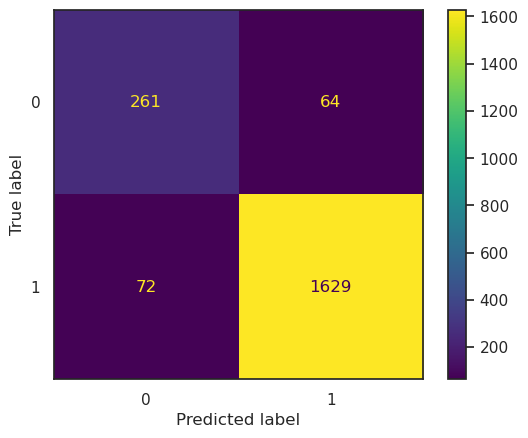

In [531]:
print(sklearn.metrics.classification_report(y_test_t, y_pred_voting_resampled))
confusion_matrix = sklearn.metrics.confusion_matrix(y_test_t, y_pred_voting_resampled)
cmd = sklearn.metrics.ConfusionMatrixDisplay(confusion_matrix)
cmd.plot()

Vidimo da su rezultati slicni, dobili smo nesto bolji recall, za klasu 0 koja je manjinska klasa, ali po ceni preciznosti, tako da je f1 score ostao isti.

#### SMOTEEEN

Probacemo i tehniku koja se i predlaze u originalnom SMOTE radu: https://arxiv.org/abs/1106.1813, gde su nakon oversamplinga SMOTE algoritmom, koristili neki vid undersampling-a kako bi se podaci procistili. Koristicemo **EditedNearestNeighbours** algoritam imbalanced-learn biblioteke (u originalnom radu je koriscen RandomUnderSampler, ali EEN najcesce daje bolje rezultate i preporucuje se). Postavljanjem parametra *sampling_strategy* na *'all'*, obrisacemo sve podatke cijih *n_neigbors* najblizih suseda pripada drugoj klasi. Iz tog ugla, ovakav undersampling mozemo posmatrati kao detekciju outlier-a, i trebalo bi da na ovaj nacin upravo nadjemo prave klasne outliere, za razliku od LOF algoritma koji je ranije diskutovan.

In [ ]:
np.random.seed(42)

hyperparam_grid = {
    "votingclassifier__weights": [uniform(0.0, 5.0).rvs(len(voting_estimators))],
    "votingclassifier__lreg__C": uniform(0.0, 1e3),
    "votingclassifier__svm__C": uniform(0.0, 1e3),
    "votingclassifier__knn__n_neighbors": [9, 11, 13],
    "smote__k_neighbors": [3, 5, 7, 9],
    "smote__sampling_strategy": uniform(0.3, 1.0),
    "editednearestneighbours__n_neighbors": [3, 5, 7, 9]
}

oversampler = imblearn.over_sampling.SMOTE(sampling_strategy=0.6, random_state=42, k_neighbors=5, n_jobs=-1)
undersampler = imblearn.under_sampling.EditedNearestNeighbours(sampling_strategy="all", n_neighbors=3, n_jobs=-1)

X_train_copy = X_train.copy(deep=True)
y_train_t_copy = np.copy(y_train_t)

random_search_smoteeen = RandomizedSearchCV(estimator=imblearn.pipeline.make_pipeline(*list(pipe.named_steps.values()), oversampler, undersampler, voting), param_distributions=hyperparam_grid, cv=kf,
                                   scoring="f1_weighted", n_iter=200, refit=True, n_jobs=-1, random_state=42, verbose=1)

random_search_smoteeen.fit(X_train_copy, y_train_t_copy)

In [533]:
print(f'Najbolji F1 score iznosi {np.round(random_search_smoteeen.best_score_, 3)} i dostize se za sledece parametre\n{random_search_smoteeen.best_params_}')

Najbolji F1 score iznosi 0.923 i dostize se za sledece parametre
{'editednearestneighbours__n_neighbors': 3, 'smote__k_neighbors': 7, 'smote__sampling_strategy': 0.3132649611598665, 'votingclassifier__knn__n_neighbors': 9, 'votingclassifier__lreg__C': 965.6320330745593, 'votingclassifier__svm__C': 808.3973481164611, 'votingclassifier__weights': array([1.87270059, 4.75357153, 3.65996971])}


In [534]:
best_voting_classifier_smoteen = random_search_smoteeen.best_estimator_
best_voting_classifier_smoteen

Pipeline(steps=[('columntransformer-1',
                 ColumnTransformer(n_jobs=-1, remainder='passthrough',
                                   transformers=[('selector', 'drop',
                                                  ['Avg_Open_To_Buy',
                                                   'Marital_Status',
                                                   'Education_Level',
                                                   'Customer_Age'])],
                                   verbose_feature_names_out=False)),
                ('columntransformer-2',
                 ColumnTransformer(n_jobs=-1, remainder='passthrough',
                                   transformers=[('nominal_transformer',
                                                  Pipeline...
                 VotingClassifier(estimators=[('lreg',
                                               LogisticRegression(C=965.6320330745593,
                                                                  class_weight='balanced',
                                                                  max_iter=500,
                                                                  n_jobs=-1,
                                                                  solver='liblinear')),
                                              ('svm',
                                               SVC(C=808.3973481164611,
                                                   class_weight='balanced',
                                                   probability=True,
                                                   random_state=42)),
                                              ('knn',
                                               KNeighborsClassifier(n_neighbors=9))],
                                  n_jobs=-1, voting='soft',
                                  weights=array([1.87270059, 4.75357153, 3.65996971])))])

In [537]:
y_pred_voting_smoteen = best_voting_classifier_smoteen.predict(X_test.copy(deep=True))

              precision    recall  f1-score   support

           0       0.75      0.76      0.75       325
           1       0.95      0.95      0.95      1701

    accuracy                           0.92      2026
   macro avg       0.85      0.85      0.85      2026
weighted avg       0.92      0.92      0.92      2026



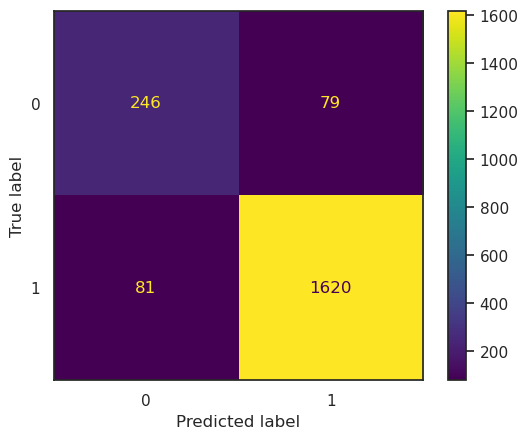

In [538]:
print(sklearn.metrics.classification_report(y_test_t, y_pred_voting_smoteen))
confusion_matrix = sklearn.metrics.confusion_matrix(y_test_t, y_pred_voting_smoteen)
cmd = sklearn.metrics.ConfusionMatrixDisplay(confusion_matrix)
cmd.plot()

Kombinacijom oversamplinga i undersamplinga nismo dobili bolje rezultate, f score je opao za obe klase, ali su rezultati ponovo jako bliski.

Text(0.5, 1.0, 'PrecisionRecall kriva za Voting klasifikatore')

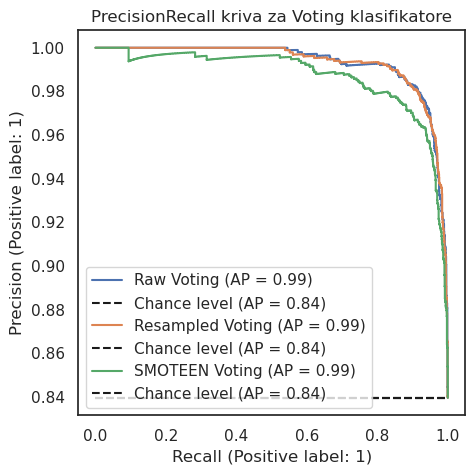

In [563]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5))

PrecisionRecallDisplay.from_estimator(
    best_voting_classifier, X_test.copy(deep=True), np.copy(y_test_t), plot_chance_level=True, ax=ax, name="Raw Voting"
)

PrecisionRecallDisplay.from_estimator(
    best_voting_classifier_resampled, X_test.copy(deep=True), np.copy(y_test_t), plot_chance_level=True, ax=ax, name="Resampled Voting"
)

PrecisionRecallDisplay.from_estimator(
    best_voting_classifier_smoteen, X_test.copy(deep=True), np.copy(y_test_t), plot_chance_level=True, ax=ax, name="SMOTEEN Voting"
)

plt.title("PrecisionRecall kriva za Voting klasifikatore")

Ove rezultate potkrepljuje i prikaz PrecisionAtRecall (PR) krive. Zbog nebalansiranog dataseta predstavlja bolju metriku od AUC_ROC metrike, a tumaci se na isti nacin - sto je veca povrsina ispod krive klasifikator je bolji. Isprekidanom linijom su prikazane performanse dummy klasifikatora.

### BaggingClassifier

Kao sto je pomenuto pre ove sekcije, BaggingClassifer se koristi da smanji varijansu overfittovanog modela, njegovim treniranjem nad podskupovima pocetnog dataseta, koji se dobijaju uzorkovanjem sa zamenom instanci iz pocetnog dataseta. U ponudi imamo 3 modela koja smo istrenirali, koji imaju visoku varijasu (pogledati *results_v* gore). Zbog nesto boljih performansi SVC klasifikatora i KNN klasifikatora, ova dva klasifikatora cemo koristiti kao osnovne modele u nasem BaggingClassifer-u (prvo jedan pa drugi).

#### Bagging sa SVC base estimatorom

In [293]:
base_svc = SVC(kernel="poly", degree=20, class_weight="balanced", C=1e4, random_state=42)
bagging_svc = BaggingClassifier(estimator=base_svc, n_estimators=50, max_samples=0.8, max_features=0.8, random_state=42, verbose=1, n_jobs=-1)

In [ ]:
results_bagging_svc = run_cv(bagging_svc, X_train, y_train_t, pipe, kf, scoring, train_score=True)

In [146]:
display_results({"bagging_svc": results_bagging_svc}, scoring, with_std=False)

,train_precision_avg,test_precision_avg,train_recall_avg,test_recall_avg,train_f1_avg,test_f1_avg,train_acc_avg,test_acc_avg,train_pr_avg,test_pr_avg,train_auc_avg,test_auc_avg
bagging_svc,0.995752,0.945762,0.999706,0.967051,0.997725,0.956271,0.996173,0.92581,0.973918,0.952747,0.917536,0.851555


Vidimo da su rezultati dosta bolji u odnosu na osnovni model koji smo koristili u Baggingu. Takodje rezultat je bolje od svih pojedinacnih rezultata modela sa velikom varijansom.<br>
Probacemo i da optimizujemo hiperparametre. Zbog toga sto je tuning hipererparametara BaggingClassifer-a jako skupo, narocito za veliki broj estimatora, prvo cemo naci optimalne vrednosti za *max_features* i *max_samples*, a zatim traziti optimalnu vrednost za SMOTE sampling strategy, i na kraju ovaj model istrenirati za veci broj estimatora (kada sam probao da trazim sve hiperparametre odjednom, trening je trajao duze od 10 sati).

In [ ]:
np.random.seed(42)

hyperparam_grid = {
    "baggingclassifier__max_samples": [0.6, 0.7, 0.8, 0.9, 1.0],
    "baggingclassifier__max_features": [0.6, 0.7, 0.8, 0.9, 1.0]
}

X_train_copy = X_train.copy(deep=True)
y_train_t_copy = np.copy(y_train_t)

# Zbog toga sto se bagging classifier jako drugo trenira sa vecim brojem estimatora, prvo cemo naci najbolje hiperparametre za max_samples i max_features, a onda cemo probati i razlicite brojeve estimatora,
# ali generalno pravilo je sto vise - to bolje
bagging_svc_warm = BaggingClassifier(estimator=base_svc, n_estimators=10, max_samples=0.8, max_features=0.8, random_state=42, verbose=1, n_jobs=-1, warm_start=True)
random_search_bagging = GridSearchCV(estimator=pipeline.make_pipeline(pipe, bagging_svc_warm), param_grid=hyperparam_grid, cv=kf,
                                   scoring="f1", refit=True, n_jobs=-1, verbose=1)

random_search_bagging.fit(X_train_copy, y_train_t_copy)

In [154]:
print(f'Najbolji F1 score iznosi {np.round(random_search_bagging.best_score_, 6)} i dostize se za sledece parametre\n{random_search_bagging.best_params_}')

Najbolji F1 score iznosi 0.953881 i dostize se za sledece parametre
{'baggingclassifier__max_features': 0.7, 'baggingclassifier__max_samples': 1.0}


Ove parametre cemo testirati za veci broj estimatora.

In [172]:
bagging_tuned_svc = BaggingClassifier(estimator=base_svc, n_estimators=50, max_samples=1.0, max_features=0.8, random_state=42, n_jobs=-1, verbose=1)

In [ ]:
results_bagging_tuned = run_cv(bagging_tuned_svc, X_train, y_train_t, pipe, kf, scoring, train_score=True)

In [174]:
display_results({"bagging_tuned": results_bagging_tuned}, scoring, with_std=False)

,train_precision_avg,test_precision_avg,train_recall_avg,test_recall_avg,train_f1_avg,test_f1_avg,train_acc_avg,test_acc_avg,train_pr_avg,test_pr_avg,train_auc_avg,test_auc_avg
bagging_tuned,0.997469,0.948816,0.999963,0.967787,0.998715,0.958187,0.99784,0.929144,0.979275,0.954617,0.934209,0.857421


In [177]:
X_train_tr = pipe.fit_transform(X_train_copy)
X_test_tr = pipe.transform(X_test.copy(deep=True))

bagging_tuned_svc.fit(X_train_tr, y_train_t_copy)
y_pred_bagging_tuned = bagging_tuned_svc.predict(X_test_tr)

[Parallel(n_jobs=16)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   2 out of  16 | elapsed:   57.7s remaining:  6.7min
[Parallel(n_jobs=16)]: Done  16 out of  16 | elapsed:  2.9min finished
[Parallel(n_jobs=16)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   2 out of  16 | elapsed:    0.2s remaining:    1.7s
[Parallel(n_jobs=16)]: Done  16 out of  16 | elapsed:    0.3s finished


              precision    recall  f1-score   support

           0       0.84      0.72      0.77       325
           1       0.95      0.97      0.96      1701

    accuracy                           0.93      2026
   macro avg       0.89      0.84      0.87      2026
weighted avg       0.93      0.93      0.93      2026



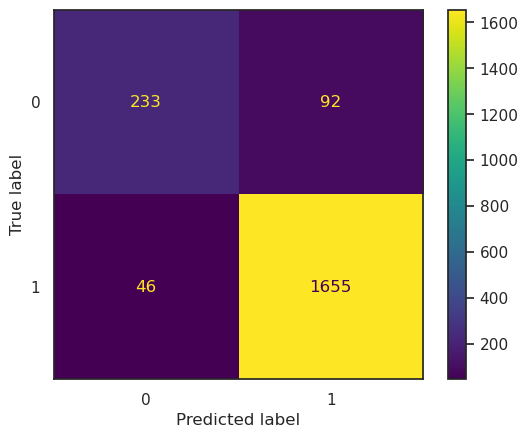

In [179]:
print(sklearn.metrics.classification_report(y_test_t, y_pred_bagging_tuned))
confusion_matrix = sklearn.metrics.confusion_matrix(y_test_t, y_pred_bagging_tuned)
cmd = sklearn.metrics.ConfusionMatrixDisplay(confusion_matrix)
cmd.plot()

Probacemo i oversampling, necemo kombinovati oversampler i undersampler, jer bi trening trajao predugo, a na primeru VotingClassifier-a smo videli da nam nije doneo poboljsanje.

In [ ]:
np.random.seed(42)

hyperparam_grid = {
    "smote__sampling_strategy": [np.random.uniform(0.4, 1.0)]
}

X_train_copy = X_train.copy(deep=True)
y_train_t_copy = np.copy(y_train_t)

oversampler = imblearn.over_sampling.SMOTE(sampling_strategy=0.6, random_state=42, n_jobs=-1)
bagging_svc_warm = BaggingClassifier(estimator=base_svc, n_estimators=10, max_samples=1.0, max_features=0.7, random_state=42, verbose=1, n_jobs=-1, warm_start=True)

random_search_bagging_smote = RandomizedSearchCV(estimator=imblearn.pipeline.make_pipeline(*list(pipe.named_steps.values()), oversampler, bagging_svc_warm), param_distributions=hyperparam_grid, cv=kf,
                                   scoring="f1_weighted", refit=True, n_jobs=-1, verbose=1, random_state=42)

random_search_bagging_smote.fit(X_train_copy, y_train_t_copy)

In [ ]:
print(f'Najbolji F1 score iznosi {np.round(random_search_bagging_smote.best_score_, 6)} i dostize se za sledece parametre\n{random_search_bagging_smote.best_params_}')

In [296]:
best_bagging_smote_svc = random_search_bagging_smote.best_estimator_
best_bagging_smote_svc

Pipeline(steps=[('columntransformer-1',
                 ColumnTransformer(n_jobs=-1, remainder='passthrough',
                                   transformers=[('selector', 'drop',
                                                  ['Avg_Open_To_Buy',
                                                   'Marital_Status',
                                                   'Education_Level',
                                                   'Customer_Age'])],
                                   verbose_feature_names_out=False)),
                ('columntransformer-2',
                 ColumnTransformer(n_jobs=-1, remainder='passthrough',
                                   transformers=[('nominal_transformer',
                                                  Pipeline...
                 IterativeImputer(initial_strategy='most_frequent', max_iter=50,
                                  missing_values=-1, random_state=42)),
                ('smote',
                 SMOTE(n_jobs=-1, random_state=42,
                       sampling_strategy=0.6247240713084175)),
                ('baggingclassifier',
                 BaggingClassifier(estimator=SVC(C=10000.0,
                                                 class_weight='balanced',
                                                 degree=20, kernel='poly',
                                                 random_state=42),
                                   max_features=0.7, n_jobs=-1, random_state=42,
                                   verbose=1, warm_start=True))])

In [297]:
y_pred_bagging_smote_svc = best_bagging_smote_svc.predict(X_test.copy(deep=True))

[Parallel(n_jobs=10)]: Using backend LokyBackend with 10 concurrent workers.
[Parallel(n_jobs=10)]: Done   2 out of  10 | elapsed:    0.3s remaining:    1.2s
[Parallel(n_jobs=10)]: Done  10 out of  10 | elapsed:    0.6s finished


              precision    recall  f1-score   support

           0       0.71      0.78      0.75       325
           1       0.96      0.94      0.95      1701

    accuracy                           0.92      2026
   macro avg       0.84      0.86      0.85      2026
weighted avg       0.92      0.92      0.92      2026



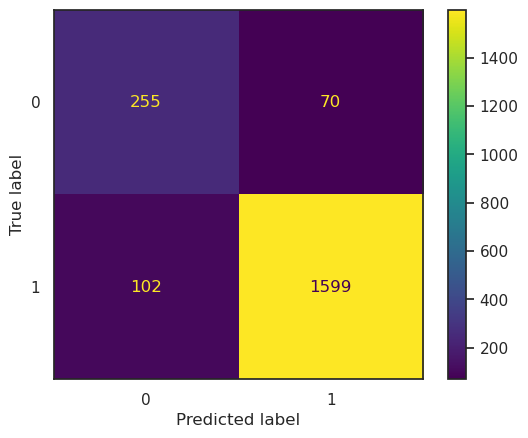

In [298]:
print(sklearn.metrics.classification_report(y_test_t, y_pred_bagging_smote_svc))
confusion_matrix = sklearn.metrics.confusion_matrix(y_test_t, y_pred_bagging_smote_svc)
cmd = sklearn.metrics.ConfusionMatrixDisplay(confusion_matrix)
sns.set_style("white")
cmd.plot()

Dobili smo losije rezultate koriscenjem SMOTE-a, mada i za nijansu bolji recall.

#### Bagging sa KNN base estimatorom

In [360]:
base_knn = KNeighborsClassifier(n_neighbors=1, n_jobs=-1)
bagging_knn = BaggingClassifier(estimator=base_knn, n_estimators=50, max_samples=0.8, max_features=0.8, random_state=42, verbose=1, n_jobs=-1)

In [ ]:
results_bagging_knn = run_cv(bagging_knn, X_train, y_train_t, pipe, kf, scoring, train_score=True)

In [362]:
display_results({"bagging_knn": results_bagging_knn}, scoring, with_std=False)

,train_precision_avg,test_precision_avg,train_recall_avg,test_recall_avg,train_f1_avg,test_f1_avg,train_acc_avg,test_acc_avg,train_pr_avg,test_pr_avg,train_auc_avg,test_auc_avg
bagging_knn,0.997945,0.929697,0.999853,0.976025,0.998144,0.912745,0.998148,0.917911,0.999998,0.988255,0.999991,0.951371


Vidimo da je BaggingClassifier poboljsao performanse osnovnog KNN modela nad validacionim atributima, takodje, ovi rezultati su bolji od pojedinacnih rezultata svih overfittovanih modela.

Trazimo najbolje hiperparametre.

In [ ]:
np.random.seed(42)

hyperparam_grid = {
    "baggingclassifier__max_samples": [0.6, 0.7, 0.8, 0.9, 1.0],
    "baggingclassifier__max_features": [0.6, 0.7, 0.8, 0.9, 1.0],
    "baggingclassifier__estimator__n_neighbors": [np.random.randint(1, 10)],
    "baggingclassifier__n_estimators": [50, 75, 100]
}

X_train_copy = X_train.copy(deep=True)
y_train_t_copy = np.copy(y_train_t)

random_search_bagging_knn = RandomizedSearchCV(estimator=pipeline.make_pipeline(pipe, bagging_knn), param_distributions=hyperparam_grid, cv=kf,
                                   scoring="f1_weighted", refit=True, n_jobs=-1, verbose=1, n_iter=200)

random_search_bagging_knn.fit(X_train_copy, y_train_t_copy)

In [368]:
print(f'Najbolji F1 score iznosi {np.round(random_search_bagging_knn.best_score_, 3)} i dostize se za sledece parametre\n{random_search_bagging_knn.best_params_}')

Najbolji F1 score iznosi 0.911 i dostize se za sledece parametre
{'baggingclassifier__n_estimators': 50, 'baggingclassifier__max_samples': 1.0, 'baggingclassifier__max_features': 0.9, 'baggingclassifier__estimator__n_neighbors': 7}


In [369]:
best_bagging_knn = random_search_bagging_knn.best_estimator_
best_bagging_knn

Pipeline(steps=[('pipeline',
                 Pipeline(steps=[('columntransformer-1',
                                  ColumnTransformer(n_jobs=-1,
                                                    remainder='passthrough',
                                                    transformers=[('selector',
                                                                   'drop',
                                                                   ['Avg_Open_To_Buy',
                                                                    'Marital_Status',
                                                                    'Education_Level',
                                                                    'Customer_Age'])],
                                                    verbose_feature_names_out=False)),
                                 ('columntransformer-2',
                                  ColumnTransformer(n_jobs=-1,
                                                    remainder='passthrough',
                                                    transformers=[('n...
                                                                    'Total_Revolving_Bal',
                                                                    'Total_Trans_Amt',
                                                                    'Total_Trans_Ct',
                                                                    'Months_on_book'])])),
                                 ('iterativeimputer',
                                  IterativeImputer(initial_strategy='most_frequent',
                                                   max_iter=50,
                                                   missing_values=-1,
                                                   random_state=42))])),
                ('baggingclassifier',
                 BaggingClassifier(estimator=KNeighborsClassifier(n_jobs=-1,
                                                                  n_neighbors=7),
                                   max_features=0.9, n_estimators=50, n_jobs=-1,
                                   random_state=42, verbose=1))])

In [370]:
y_pred_bagging_knn = best_bagging_knn.predict(X_test.copy(deep=True))

[Parallel(n_jobs=16)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   2 out of  16 | elapsed:    0.5s remaining:    3.2s
[Parallel(n_jobs=16)]: Done  16 out of  16 | elapsed:    0.8s finished


              precision    recall  f1-score   support

           0       0.85      0.60      0.70       325
           1       0.93      0.98      0.95      1701

    accuracy                           0.92      2026
   macro avg       0.89      0.79      0.83      2026
weighted avg       0.91      0.92      0.91      2026



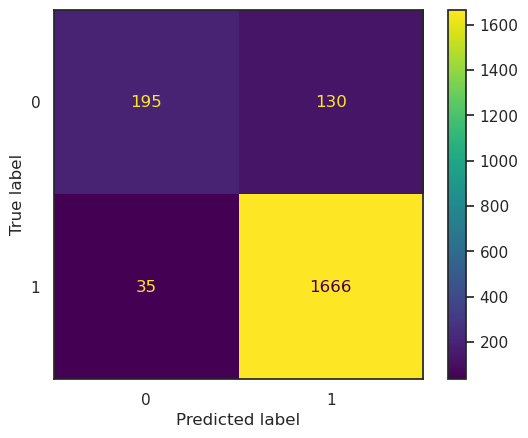

In [371]:
print(sklearn.metrics.classification_report(y_test_t, y_pred_bagging_knn))
confusion_matrix = sklearn.metrics.confusion_matrix(y_test_t, y_pred_bagging_knn)
cmd = sklearn.metrics.ConfusionMatrixDisplay(confusion_matrix)
sns.set_style("white")
cmd.plot()

Vidimo da imamo dosta pogresno klasifikovanih primeraka manjinske klase, tako da cemo probati da poboljsamo ovo uz pomoc SMOTE oversamplinga.

In [ ]:
np.random.seed(42)

hyperparam_grid = {
    "baggingclassifier__max_samples": [0.6, 0.7, 0.8, 0.9, 1.0],
    "baggingclassifier__max_features": [0.6, 0.7, 0.8, 0.9, 1.0],
    "baggingclassifier__estimator__n_neighbors": [np.random.randint(1, 10)],
    "baggingclassifier__n_estimators": [50, 75, 100],
    "smote__k_neighbors": [np.random.randint(1, 15)],
    "smote__sampling_strategy": [np.random.uniform(0.5, 1.0)]
}

X_train_copy = X_train.copy(deep=True)
y_train_t_copy = np.copy(y_train_t)

oversampler = imblearn.over_sampling.SMOTE(k_neighbors=3, sampling_strategy=0.6)

random_search_bagging_knn_smote = RandomizedSearchCV(estimator=imblearn.pipeline.make_pipeline(*list(pipe.named_steps.values()), oversampler, bagging_knn), param_distributions=hyperparam_grid, cv=kf,
                                   scoring="f1_weighted", refit=True, n_jobs=-1, verbose=1, n_iter=200)

random_search_bagging_knn_smote.fit(X_train_copy, y_train_t_copy)

In [374]:
print(f'Najbolji F1 score iznosi {np.round(random_search_bagging_knn_smote.best_score_, 3)} i dostize se za sledece parametre\n{random_search_bagging_knn_smote.best_params_}')

Najbolji F1 score iznosi 0.922 i dostize se za sledece parametre
{'smote__sampling_strategy': 0.9753571532049581, 'smote__k_neighbors': 4, 'baggingclassifier__n_estimators': 100, 'baggingclassifier__max_samples': 1.0, 'baggingclassifier__max_features': 0.6, 'baggingclassifier__estimator__n_neighbors': 7}


In [375]:
best_bagging_knn_smote = random_search_bagging_knn_smote.best_estimator_
best_bagging_knn_smote

Pipeline(steps=[('columntransformer-1',
                 ColumnTransformer(n_jobs=-1, remainder='passthrough',
                                   transformers=[('selector', 'drop',
                                                  ['Avg_Open_To_Buy',
                                                   'Marital_Status',
                                                   'Education_Level',
                                                   'Customer_Age'])],
                                   verbose_feature_names_out=False)),
                ('columntransformer-2',
                 ColumnTransformer(n_jobs=-1, remainder='passthrough',
                                   transformers=[('nominal_transformer',
                                                  Pipeline...
                ('iterativeimputer',
                 IterativeImputer(initial_strategy='most_frequent', max_iter=50,
                                  missing_values=-1, random_state=42)),
                ('smote',
                 SMOTE(k_neighbors=4, sampling_strategy=0.9753571532049581)),
                ('baggingclassifier',
                 BaggingClassifier(estimator=KNeighborsClassifier(n_jobs=-1,
                                                                  n_neighbors=7),
                                   max_features=0.6, n_estimators=100,
                                   n_jobs=-1, random_state=42, verbose=1))])

In [376]:
y_pred_bagging_knn_smote = best_bagging_knn_smote.predict(X_test.copy(deep=True))

[Parallel(n_jobs=16)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   2 out of  16 | elapsed:    0.5s remaining:    3.7s
[Parallel(n_jobs=16)]: Done  16 out of  16 | elapsed:    1.1s finished


              precision    recall  f1-score   support

           0       0.69      0.86      0.76       325
           1       0.97      0.93      0.95      1701

    accuracy                           0.91      2026
   macro avg       0.83      0.89      0.85      2026
weighted avg       0.93      0.91      0.92      2026



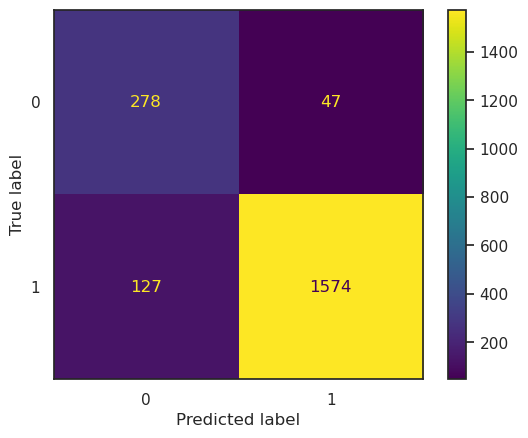

In [377]:
print(sklearn.metrics.classification_report(y_test_t, y_pred_bagging_knn_smote))
confusion_matrix = sklearn.metrics.confusion_matrix(y_test_t, y_pred_bagging_knn_smote)
cmd = sklearn.metrics.ConfusionMatrixDisplay(confusion_matrix)
sns.set_style("white")
cmd.plot()

Rezultati su znacajno bolji. Kako je vrednost parametra sampling strategy 0.97, sto znaci da je izgenerisano dosta primeraka minority klase, i da su one skoro izbalansirane, ali probacemo i kombinaciju sa undersamplerom, kao neki vid izbaciavanja outliera.

In [ ]:
np.random.seed(42)

hyperparam_grid = {
    "baggingclassifier__max_samples": [0.6, 0.7, 0.8, 0.9, 1.0],
    "baggingclassifier__max_features": [0.6, 0.7, 0.8, 0.9, 1.0],
    "baggingclassifier__estimator__n_neighbors": [np.random.randint(1, 10)],
    "baggingclassifier__n_estimators": [50, 75, 100],
    "smote__k_neighbors": [np.random.randint(1, 15)],
    "smote__sampling_strategy": [np.random.uniform(0.5, 1.0)],
    "editednearestneighbours__n_neighbors": [np.random.randint(1, 15)]
}

X_train_copy = X_train.copy(deep=True)
y_train_t_copy = np.copy(y_train_t)

oversampler = imblearn.over_sampling.SMOTE(k_neighbors=3, sampling_strategy=0.6)
undersampler = imblearn.under_sampling.EditedNearestNeighbours(n_neighbors=3, sampling_strategy="all")

random_search_bagging_knn_resampled = RandomizedSearchCV(estimator=imblearn.pipeline.make_pipeline(*list(pipe.named_steps.values()), oversampler, undersampler, bagging_knn), param_distributions=hyperparam_grid, cv=kf,
                                   scoring="f1_weighted", refit=True, n_jobs=-1, verbose=1, n_iter=200)

random_search_bagging_knn_resampled.fit(X_train_copy, y_train_t_copy)

In [379]:
print(f'Najbolji F1 score iznosi {np.round(random_search_bagging_knn_resampled.best_score_, 3)} i dostize se za sledece parametre\n{random_search_bagging_knn_resampled.best_params_}')

Najbolji F1 score iznosi 0.87 i dostize se za sledece parametre
{'smote__sampling_strategy': 0.9753571532049581, 'smote__k_neighbors': 4, 'editednearestneighbours__n_neighbors': 11, 'baggingclassifier__n_estimators': 75, 'baggingclassifier__max_samples': 1.0, 'baggingclassifier__max_features': 0.6, 'baggingclassifier__estimator__n_neighbors': 7}


In [380]:
best_bagging_knn_resampled = random_search_bagging_knn_resampled.best_estimator_
best_bagging_knn_resampled

Pipeline(steps=[('columntransformer-1',
                 ColumnTransformer(n_jobs=-1, remainder='passthrough',
                                   transformers=[('selector', 'drop',
                                                  ['Avg_Open_To_Buy',
                                                   'Marital_Status',
                                                   'Education_Level',
                                                   'Customer_Age'])],
                                   verbose_feature_names_out=False)),
                ('columntransformer-2',
                 ColumnTransformer(n_jobs=-1, remainder='passthrough',
                                   transformers=[('nominal_transformer',
                                                  Pipeline...
                                  missing_values=-1, random_state=42)),
                ('smote',
                 SMOTE(k_neighbors=4, sampling_strategy=0.9753571532049581)),
                ('editednearestneighbours',
                 EditedNearestNeighbours(n_neighbors=11,
                                         sampling_strategy='all')),
                ('baggingclassifier',
                 BaggingClassifier(estimator=KNeighborsClassifier(n_jobs=-1,
                                                                  n_neighbors=7),
                                   max_features=0.6, n_estimators=75, n_jobs=-1,
                                   random_state=42, verbose=1))])

In [381]:
y_pred_bagging_knn_resampled = best_bagging_knn_resampled.predict(X_test.copy(deep=True))

[Parallel(n_jobs=16)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   2 out of  16 | elapsed:    0.3s remaining:    2.0s
[Parallel(n_jobs=16)]: Done  16 out of  16 | elapsed:    0.7s finished


              precision    recall  f1-score   support

           0       0.53      0.90      0.67       325
           1       0.98      0.85      0.91      1701

    accuracy                           0.86      2026
   macro avg       0.75      0.88      0.79      2026
weighted avg       0.91      0.86      0.87      2026



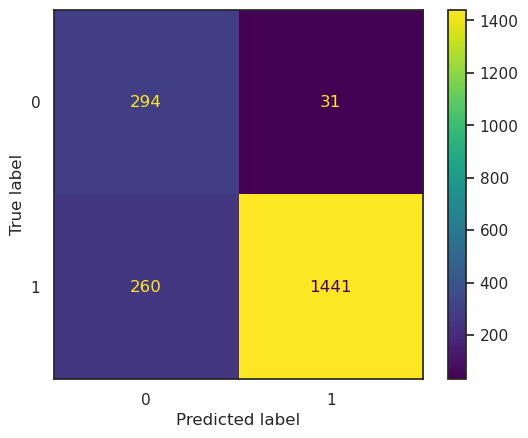

In [382]:
print(sklearn.metrics.classification_report(y_test_t, y_pred_bagging_knn_resampled))
confusion_matrix = sklearn.metrics.confusion_matrix(y_test_t, y_pred_bagging_knn_resampled)
cmd = sklearn.metrics.ConfusionMatrixDisplay(confusion_matrix)
sns.set_style("white")
cmd.plot()

Vidimo da je resamplingom znacajno opao precission i f1 score za manjinsku klasu. Najbolje rezultate dao je smote oversampling.

[Parallel(n_jobs=16)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   2 out of  16 | elapsed:    0.6s remaining:    4.2s
[Parallel(n_jobs=16)]: Done  16 out of  16 | elapsed:    0.8s finished
[Parallel(n_jobs=16)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   2 out of  16 | elapsed:    0.6s remaining:    4.0s
[Parallel(n_jobs=16)]: Done  16 out of  16 | elapsed:    1.2s finished
[Parallel(n_jobs=16)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   2 out of  16 | elapsed:    0.4s remaining:    2.8s
[Parallel(n_jobs=16)]: Done  16 out of  16 | elapsed:    0.6s finished


Text(0.5, 1.0, 'PrecisionRecall kriva za Bagging KNN klasifikatore')

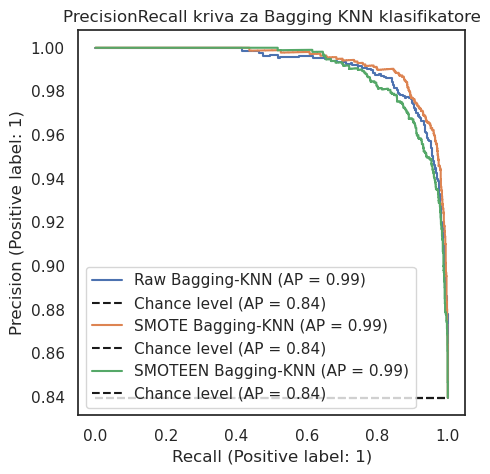

In [383]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5))

prd_raw = PrecisionRecallDisplay.from_estimator(
    best_bagging_knn, X_test.copy(deep=True), np.copy(y_test_t), plot_chance_level=True, ax=ax, name="Raw Bagging-KNN"
)

prd_resampled = PrecisionRecallDisplay.from_estimator(
    best_bagging_knn_smote, X_test.copy(deep=True), np.copy(y_test_t), plot_chance_level=True, ax=ax, name="SMOTE Bagging-KNN"
)

prd_smoteen = PrecisionRecallDisplay.from_estimator(
    best_bagging_knn_resampled, X_test.copy(deep=True), np.copy(y_test_t), plot_chance_level=True, ax=ax, name="SMOTEEN Bagging-KNN"
)

plt.title("PrecisionRecall kriva za Bagging KNN klasifikatore")

I sa grafika PR krive vidimo da je SMOTE (narandzasta linija) dao najbolje rezultate - najveca povrsina je ispod narandzaste krive.

### StackingClassifier

In [ ]:
biased_estimators = list(zip(biased_models.keys(), biased_models.values()))
stacking = StackingClassifier(estimators=biased_estimators, stack_method="auto", n_jobs=-1, verbose=1)

results_stacking = results_voting = run_cv(stacking, X_train, y_train_t, pipe, kf, scoring=scoring, train_score=True)

In [541]:
display_results({"stacking": results_stacking}, scoring)

,train_precision_avg,test_precision_avg,train_recall_avg,test_recall_avg,train_f1_avg,test_f1_avg,train_acc_avg,test_acc_avg,train_pr_avg,test_pr_avg,train_auc_avg,test_auc_avg
stacking,0.900176,0.900062,0.969848,0.968817,0.871941,0.8709,0.884428,0.883472,0.97237,0.972125,0.886361,0.885308


Rezultati su bolji nego kod pojedinacnih biased modela. Probacemo da ih dodatno poboljsamo optimizacijom hiperparametara.

#### Osnovni podaci

In [ ]:
np.random.seed(42)

hyperparam_grid = {
    "stackingclassifier__lreg__C": uniform(0.0, 1e4),
    "stackingclassifier__svm__C": uniform(0.0, 1e4),
    "stackingclassifier__stump_tree__max_depth": randint(1, 10)
}

X_train_copy = X_train.copy(deep=True)
y_train_t_copy = np.copy(y_train_t)

random_search_stacking = RandomizedSearchCV(estimator=pipeline.make_pipeline(pipe, stacking), param_distributions=hyperparam_grid, cv=kf,
                                   scoring="f1_weighted", n_iter=200, refit=True, n_jobs=-1, random_state=42, verbose=1)

random_search_stacking.fit(X_train_copy, y_train_t_copy)

In [543]:
print(f'Najbolji F1 score iznosi {np.round(random_search_stacking.best_score_, 3)} i dostize se za sledece parametre\n{random_search_stacking.best_params_}')

Najbolji F1 score iznosi 0.945 i dostize se za sledece parametre
{'stackingclassifier__lreg__C': 3745.401188473625, 'stackingclassifier__stump_tree__max_depth': 8, 'stackingclassifier__svm__C': 5986.584841970366}


In [545]:
best_stacking = random_search_stacking.best_estimator_
best_stacking

Pipeline(steps=[('pipeline',
                 Pipeline(steps=[('columntransformer-1',
                                  ColumnTransformer(n_jobs=-1,
                                                    remainder='passthrough',
                                                    transformers=[('selector',
                                                                   'drop',
                                                                   ['Avg_Open_To_Buy',
                                                                    'Marital_Status',
                                                                    'Education_Level',
                                                                    'Customer_Age'])],
                                                    verbose_feature_names_out=False)),
                                 ('columntransformer-2',
                                  ColumnTransformer(n_jobs=-1,
                                                    remainder='passthrough',
                                                    transformers=[('n...
                ('stackingclassifier',
                 StackingClassifier(estimators=[('lreg',
                                                 LogisticRegression(C=3745.401188473625,
                                                                    class_weight='balanced',
                                                                    max_iter=200,
                                                                    n_jobs=-1,
                                                                    penalty='l1',
                                                                    solver='liblinear')),
                                                ('svm',
                                                 LinearSVC(C=5986.584841970366,
                                                           class_weight='balanced',
                                                           dual=False,
                                                           penalty='l1')),
                                                ('stump_tree',
                                                 DecisionTreeClassifier(max_depth=8,
                                                                        random_state=42))],
                                    n_jobs=-1, verbose=1))])

In [546]:
y_pred_stacking = best_stacking.predict(X_test.copy(deep=True))

              precision    recall  f1-score   support

           0       0.85      0.81      0.83       325
           1       0.96      0.97      0.97      1701

    accuracy                           0.95      2026
   macro avg       0.91      0.89      0.90      2026
weighted avg       0.95      0.95      0.95      2026



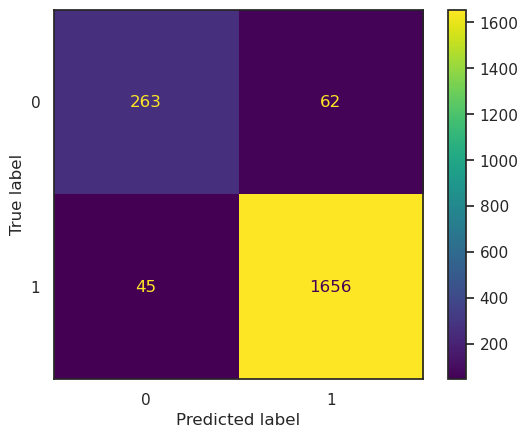

In [547]:
print(sklearn.metrics.classification_report(y_test_t, y_pred_stacking))
confusion_matrix = sklearn.metrics.confusion_matrix(y_test_t, y_pred_stacking)
cmd = sklearn.metrics.ConfusionMatrixDisplay(confusion_matrix)
cmd.plot()

Ovi rezultati deluju najbolje do sada, pa cemo probati i SMOTE koji bi trebalo da ih dodatno poboljsa.

#### SMOTE

In [ ]:
results_stacking_smote = run_cv(stacking, X_train, y_train_t, pipe, kf, resampled=True, scoring=scoring, train_score=True)

In [550]:
display_results({"stacking_smote": results_stacking_smote}, scoring)

,train_precision_avg,test_precision_avg,train_recall_avg,test_recall_avg,train_f1_avg,test_f1_avg,train_acc_avg,test_acc_avg,train_pr_avg,test_pr_avg,train_auc_avg,test_auc_avg
stacking_smote,0.953534,0.951974,0.822437,0.820413,0.83472,0.832131,0.817337,0.814466,0.973165,0.972852,0.888369,0.887136


Inicijalni rezultati su losiji nego pocetni bez SMOTE oversampliga, ali pokusacemo da optimizujemo hiperparametre.

In [ ]:
np.random.seed(42)


hyperparam_grid = {
    "stackingclassifier__lreg__C": uniform(0.0, 1e4),
    "stackingclassifier__svm__C": uniform(0.0, 1e4),
    "stackingclassifier__stump_tree__max_depth": randint(1, 10),
    "smote__k_neighbors": [3, 5, 7, 9],
    "smote__sampling_strategy": uniform(0.3, 1.0)
}

oversampler = imblearn.over_sampling.SMOTE(sampling_strategy=0.6, random_state=42, k_neighbors=5, n_jobs=-1)

X_train_copy = X_train.copy(deep=True)
y_train_t_copy = np.copy(y_train_t)

random_search_stacking_smote = RandomizedSearchCV(estimator=imblearn.pipeline.make_pipeline(*list(pipe.named_steps.values()), oversampler, stacking), param_distributions=hyperparam_grid, cv=kf,
                                   scoring="f1_weighted", n_iter=200, refit=True, n_jobs=-1, random_state=42, verbose=1)

random_search_stacking_smote.fit(X_train_copy, y_train_t_copy)

In [552]:
print(f'Najbolji F1 score iznosi {np.round(random_search_stacking_smote.best_score_, 3)} i dostize se za sledece parametre\n{random_search_stacking_smote.best_params_}')

Najbolji F1 score iznosi 0.944 i dostize se za sledece parametre
{'smote__k_neighbors': 7, 'smote__sampling_strategy': 0.38328441119525963, 'stackingclassifier__lreg__C': 917.0414725848109, 'stackingclassifier__stump_tree__max_depth': 9, 'stackingclassifier__svm__C': 5537.030523458007}


In [553]:
best_stacking_smote = random_search_stacking_smote.best_estimator_
best_stacking_smote

Pipeline(steps=[('columntransformer-1',
                 ColumnTransformer(n_jobs=-1, remainder='passthrough',
                                   transformers=[('selector', 'drop',
                                                  ['Avg_Open_To_Buy',
                                                   'Marital_Status',
                                                   'Education_Level',
                                                   'Customer_Age'])],
                                   verbose_feature_names_out=False)),
                ('columntransformer-2',
                 ColumnTransformer(n_jobs=-1, remainder='passthrough',
                                   transformers=[('nominal_transformer',
                                                  Pipeline...
                ('stackingclassifier',
                 StackingClassifier(estimators=[('lreg',
                                                 LogisticRegression(C=917.0414725848109,
                                                                    class_weight='balanced',
                                                                    max_iter=200,
                                                                    n_jobs=-1,
                                                                    penalty='l1',
                                                                    solver='liblinear')),
                                                ('svm',
                                                 LinearSVC(C=5537.030523458007,
                                                           class_weight='balanced',
                                                           dual=False,
                                                           penalty='l1')),
                                                ('stump_tree',
                                                 DecisionTreeClassifier(max_depth=9,
                                                                        random_state=42))],
                                    n_jobs=-1, verbose=1))])

In [554]:
y_pred_stacking_smote = best_stacking_smote.predict(X_test.copy(deep=True))

              precision    recall  f1-score   support

           0       0.79      0.85      0.82       325
           1       0.97      0.96      0.96      1701

    accuracy                           0.94      2026
   macro avg       0.88      0.90      0.89      2026
weighted avg       0.94      0.94      0.94      2026



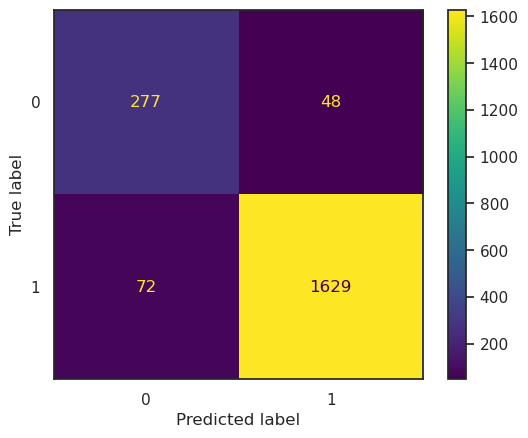

In [555]:
print(sklearn.metrics.classification_report(y_test_t, y_pred_stacking_smote))
confusion_matrix = sklearn.metrics.confusion_matrix(y_test_t, y_pred_stacking_smote)
cmd = sklearn.metrics.ConfusionMatrixDisplay(confusion_matrix)
cmd.plot()

Rezultati su, interesantno, losiji za nijansu, ali jako bliski rezultatima bez koriscenja SMOTE oversamplinga. Imamo nesto bolji recall a nesto losiji precision za manjinsku klasu.

#### SMOTEEEN

In [ ]:
np.random.seed(42)


hyperparam_grid = {
    "stackingclassifier__lreg__C": uniform(0.0, 1e4),
    "stackingclassifier__svm__C": uniform(0.0, 1e4),
    "stackingclassifier__stump_tree__max_depth": randint(1, 10),
    "smote__k_neighbors": [3, 5, 7, 9],
    "smote__sampling_strategy": uniform(0.3, 1.0),
    "editednearestneighbours__n_neighbors": [3, 5, 7, 9]
}

oversampler = imblearn.over_sampling.SMOTE(sampling_strategy=0.6, random_state=42, k_neighbors=5, n_jobs=-1)
undersampler = imblearn.under_sampling.EditedNearestNeighbours(sampling_strategy="all", n_neighbors=3, n_jobs=-1)

X_train_copy = X_train.copy(deep=True)
y_train_t_copy = np.copy(y_train_t)

random_search_stacking_resampled = RandomizedSearchCV(estimator=imblearn.pipeline.make_pipeline(*list(pipe.named_steps.values()), oversampler, undersampler, stacking), param_distributions=hyperparam_grid, cv=kf,
                                   scoring="f1_weighted", n_iter=200, refit=True, n_jobs=-1, random_state=42, verbose=1)

random_search_stacking_resampled.fit(X_train_copy, y_train_t_copy)

In [557]:
print(f'Najbolji F1 score iznosi {np.round(random_search_stacking_resampled.best_score_, 3)} i dostize se za sledece parametre\n{random_search_stacking_resampled.best_params_}')

Najbolji F1 score iznosi 0.929 i dostize se za sledece parametre
{'editednearestneighbours__n_neighbors': 3, 'smote__k_neighbors': 7, 'smote__sampling_strategy': 0.3069521305311907, 'stackingclassifier__lreg__C': 5107.473025775657, 'stackingclassifier__stump_tree__max_depth': 9, 'stackingclassifier__svm__C': 4848.299713589832}


In [558]:
best_stacking_resampled = random_search_stacking_resampled.best_estimator_
best_stacking_resampled

Pipeline(steps=[('columntransformer-1',
                 ColumnTransformer(n_jobs=-1, remainder='passthrough',
                                   transformers=[('selector', 'drop',
                                                  ['Avg_Open_To_Buy',
                                                   'Marital_Status',
                                                   'Education_Level',
                                                   'Customer_Age'])],
                                   verbose_feature_names_out=False)),
                ('columntransformer-2',
                 ColumnTransformer(n_jobs=-1, remainder='passthrough',
                                   transformers=[('nominal_transformer',
                                                  Pipeline...
                ('stackingclassifier',
                 StackingClassifier(estimators=[('lreg',
                                                 LogisticRegression(C=5107.473025775657,
                                                                    class_weight='balanced',
                                                                    max_iter=200,
                                                                    n_jobs=-1,
                                                                    penalty='l1',
                                                                    solver='liblinear')),
                                                ('svm',
                                                 LinearSVC(C=4848.299713589832,
                                                           class_weight='balanced',
                                                           dual=False,
                                                           penalty='l1')),
                                                ('stump_tree',
                                                 DecisionTreeClassifier(max_depth=9,
                                                                        random_state=42))],
                                    n_jobs=-1, verbose=1))])

In [559]:
y_pred_stacking_resampled = best_stacking_resampled.predict(X_test.copy(deep=True))

              precision    recall  f1-score   support

           0       0.80      0.78      0.79       325
           1       0.96      0.96      0.96      1701

    accuracy                           0.93      2026
   macro avg       0.88      0.87      0.88      2026
weighted avg       0.93      0.93      0.93      2026



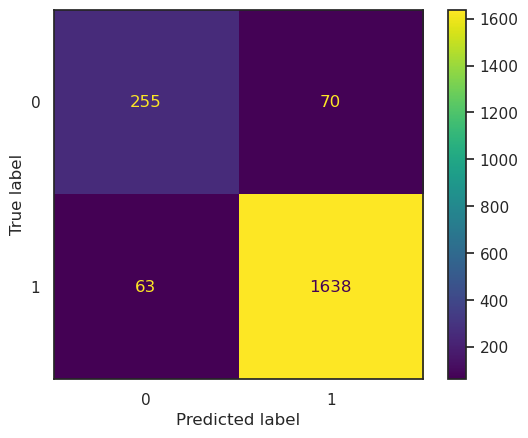

In [560]:
print(sklearn.metrics.classification_report(y_test_t, y_pred_stacking_resampled))
confusion_matrix = sklearn.metrics.confusion_matrix(y_test_t, y_pred_stacking_resampled)
cmd = sklearn.metrics.ConfusionMatrixDisplay(confusion_matrix)
cmd.plot()

Text(0.5, 1.0, 'PrecisionRecall kriva za Stacking klasifikatore')

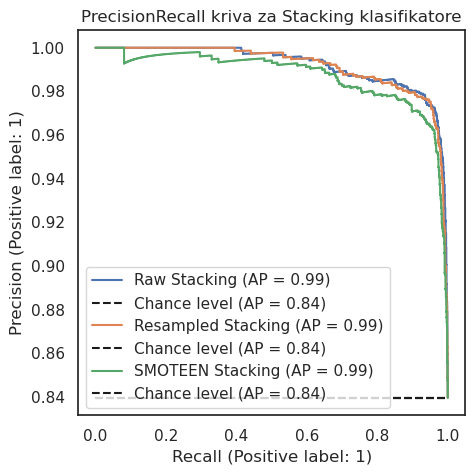

In [562]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5))

PrecisionRecallDisplay.from_estimator(
    best_stacking, X_test.copy(deep=True), np.copy(y_test_t), plot_chance_level=True, ax=ax, name="Raw Stacking"
)

PrecisionRecallDisplay.from_estimator(
    best_stacking_smote, X_test.copy(deep=True), np.copy(y_test_t), plot_chance_level=True, ax=ax, name="Resampled Stacking"
)

PrecisionRecallDisplay.from_estimator(
    best_stacking_resampled, X_test.copy(deep=True), np.copy(y_test_t), plot_chance_level=True, ax=ax, name="SMOTEEN Stacking"
)

plt.title("PrecisionRecall kriva za Stacking klasifikatore")

### AdaBoost

In [564]:
ada = AdaBoostClassifier(estimator=biased_models["stump_tree"], algorithm="SAMME", n_estimators=100, learning_rate=1, random_state=42)

results_ada = results_voting = run_cv(ada, X_train, y_train_t, pipe, kf, scoring=scoring, train_score=True)

In [566]:
display_results({"adaboost": results_ada}, scoring)

,train_precision_avg,test_precision_avg,train_recall_avg,test_recall_avg,train_f1_avg,test_f1_avg,train_acc_avg,test_acc_avg,train_pr_avg,test_pr_avg,train_auc_avg,test_auc_avg
adaboost,0.965262,0.963389,0.983711,0.981909,0.95567,0.952398,0.95661,0.953462,0.997488,0.99605,0.987068,0.981159


#### Osnovni podaci

Kako je ideja AdaBoost algoritma da osnovni estimator bude takozvani Weak learner, gde smo mi izabrali DecisionTree dubine 1, jedini hiperparametri koje treba podesiti su *learning_rate* i *n_estimators*.

In [571]:
np.random.seed(42)

hyperparam_grid = {
    "adaboostclassifier__n_estimators": [50, 100, 150],
    "adaboostclassifier__learning_rate": uniform(0.0, 1e1),    # za veci opseg se dobija sample_weight overflow tako da cemo ostaviti ovaj
}

X_train_copy = X_train.copy(deep=True)
y_train_t_copy = np.copy(y_train_t)

random_search_ada = RandomizedSearchCV(estimator=pipeline.make_pipeline(pipe, ada), param_distributions=hyperparam_grid, cv=kf,
                                   scoring="f1_weighted", n_iter=300, refit=True, n_jobs=-1, random_state=42, verbose=1)

random_search_ada.fit(X_train_copy, y_train_t_copy)

Fitting 5 folds for each of 300 candidates, totalling 1500 fits


RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
                   estimator=Pipeline(steps=[('pipeline',
                                              Pipeline(steps=[('columntransformer-1',
                                                               ColumnTransformer(n_jobs=-1,
                                                                                 remainder='passthrough',
                                                                                 transformers=[('selector',
                                                                                                'drop',
                                                                                                ['Avg_Open_To_Buy',
                                                                                                 'Marital_Status',
                                                                                                 'Education_Level',
                                                                                                 'Customer_Age'])],
                                                                                 verbose_feature_names_out=False)),
                                                              ('c...
                                                                 estimator=DecisionTreeClassifier(max_depth=1,
                                                                                                  random_state=42),
                                                                 learning_rate=1,
                                                                 n_estimators=100,
                                                                 random_state=42))]),
                   n_iter=300, n_jobs=-1,
                   param_distributions={'adaboostclassifier__learning_rate': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x7abeda986eb0>,
                                        'adaboostclassifier__n_estimators': [50,
                                                                             100,
                                                                             150]},
                   random_state=42, scoring='f1_weighted', verbose=1)

In [572]:
print(f'Najbolji F1 score iznosi {np.round(random_search_ada.best_score_, 3)} i dostize se za sledece parametre\n{random_search_ada.best_params_}')

Najbolji F1 score iznosi 0.958 i dostize se za sledece parametre
{'adaboostclassifier__learning_rate': 1.5071754396542947, 'adaboostclassifier__n_estimators': 150}


In [573]:
best_ada = random_search_ada.best_estimator_
best_ada

Pipeline(steps=[('pipeline',
                 Pipeline(steps=[('columntransformer-1',
                                  ColumnTransformer(n_jobs=-1,
                                                    remainder='passthrough',
                                                    transformers=[('selector',
                                                                   'drop',
                                                                   ['Avg_Open_To_Buy',
                                                                    'Marital_Status',
                                                                    'Education_Level',
                                                                    'Customer_Age'])],
                                                    verbose_feature_names_out=False)),
                                 ('columntransformer-2',
                                  ColumnTransformer(n_jobs=-1,
                                                    remainder='passthrough',
                                                    transformers=[('n...
                                                                    'Total_Trans_Ct',
                                                                    'Months_on_book'])])),
                                 ('iterativeimputer',
                                  IterativeImputer(initial_strategy='most_frequent',
                                                   max_iter=50,
                                                   missing_values=-1,
                                                   random_state=42))])),
                ('adaboostclassifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=DecisionTreeClassifier(max_depth=1,
                                                                     random_state=42),
                                    learning_rate=1.5071754396542947,
                                    n_estimators=150, random_state=42))])

In [574]:
y_pred_ada = best_ada.predict(X_test.copy(deep=True))

              precision    recall  f1-score   support

           0       0.89      0.86      0.87       325
           1       0.97      0.98      0.98      1701

    accuracy                           0.96      2026
   macro avg       0.93      0.92      0.92      2026
weighted avg       0.96      0.96      0.96      2026



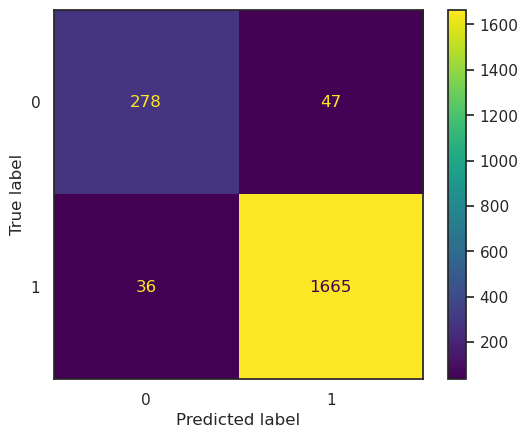

In [575]:
print(sklearn.metrics.classification_report(y_test_t, y_pred_ada))
confusion_matrix = sklearn.metrics.confusion_matrix(y_test_t, y_pred_ada)
cmd = sklearn.metrics.ConfusionMatrixDisplay(confusion_matrix)
cmd.plot()

Dobili smo i najbolje rezultate do sada!

#### SMOTE

In [576]:
results_ada_smote = run_cv(ada, X_train, y_train_t, pipe, kf, resampled=True, scoring=scoring, train_score=True)

Resampling...


In [577]:
display_results({"ada_smote": results_ada_smote}, scoring)

,train_precision_avg,test_precision_avg,train_recall_avg,test_recall_avg,train_f1_avg,test_f1_avg,train_acc_avg,test_acc_avg,train_pr_avg,test_pr_avg,train_auc_avg,test_auc_avg
ada_smote,0.981724,0.979531,0.921569,0.920721,0.924037,0.921653,0.919763,0.917293,0.994421,0.993645,0.972554,0.969575


Inicijalni rezultati nisu tako dobri, pa optimizujemo hiperparametre.

In [ ]:
np.random.seed(42)

hyperparam_grid = {
    "adaboostclassifier__n_estimators": [50, 100, 150],
    "adaboostclassifier__learning_rate": uniform(0.0, 1e1),
    "smote__sampling_strategy": uniform(0.3, 1.0),
    "smote__k_neighbors": randint(2, 15)
}

X_train_copy = X_train.copy(deep=True)
y_train_t_copy = np.copy(y_train_t)

oversampler = imblearn.over_sampling.SMOTE(sampling_strategy=0.6, random_state=42, k_neighbors=5, n_jobs=-1)

random_search_ada_smote = RandomizedSearchCV(estimator=imblearn.pipeline.make_pipeline(*list(pipe.named_steps.values()), oversampler, ada), param_distributions=hyperparam_grid, cv=kf,
                                   scoring="f1_weighted", n_iter=300, refit=True, n_jobs=-1, random_state=42, verbose=1)

random_search_ada_smote.fit(X_train_copy, y_train_t_copy)

In [580]:
print(f'Najbolji F1 score iznosi {np.round(random_search_ada_smote.best_score_, 3)} i dostize se za sledece parametre\n{random_search_ada_smote.best_params_}')

Najbolji F1 score iznosi 0.955 i dostize se za sledece parametre
{'adaboostclassifier__learning_rate': 1.2887972191064923, 'adaboostclassifier__n_estimators': 150, 'smote__k_neighbors': 12, 'smote__sampling_strategy': 0.4388271726494101}


In [581]:
best_ada_smote = random_search_ada_smote.best_estimator_
best_ada_smote

Pipeline(steps=[('columntransformer-1',
                 ColumnTransformer(n_jobs=-1, remainder='passthrough',
                                   transformers=[('selector', 'drop',
                                                  ['Avg_Open_To_Buy',
                                                   'Marital_Status',
                                                   'Education_Level',
                                                   'Customer_Age'])],
                                   verbose_feature_names_out=False)),
                ('columntransformer-2',
                 ColumnTransformer(n_jobs=-1, remainder='passthrough',
                                   transformers=[('nominal_transformer',
                                                  Pipeline...
                 IterativeImputer(initial_strategy='most_frequent', max_iter=50,
                                  missing_values=-1, random_state=42)),
                ('smote',
                 SMOTE(k_neighbors=12, n_jobs=-1, random_state=42,
                       sampling_strategy=0.4388271726494101)),
                ('adaboostclassifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=DecisionTreeClassifier(max_depth=1,
                                                                     random_state=42),
                                    learning_rate=1.2887972191064923,
                                    n_estimators=150, random_state=42))])

In [583]:
y_pred_ada_smote = best_ada_smote.predict(X_test.copy(deep=True))

              precision    recall  f1-score   support

           0       0.83      0.89      0.85       325
           1       0.98      0.96      0.97      1701

    accuracy                           0.95      2026
   macro avg       0.90      0.93      0.91      2026
weighted avg       0.95      0.95      0.95      2026



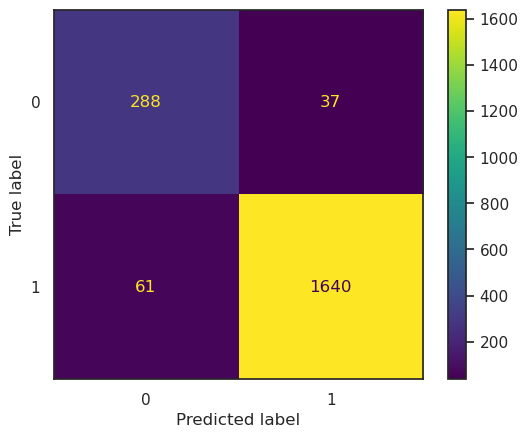

In [584]:
print(sklearn.metrics.classification_report(y_test_t, y_pred_ada_smote))
confusion_matrix = sklearn.metrics.confusion_matrix(y_test_t, y_pred_ada_smote)
cmd = sklearn.metrics.ConfusionMatrixDisplay(confusion_matrix)
cmd.plot()

Ponovo imamo slicne rezultate kao i za prethodne algoritme. Nesto bolji recall za minority klasu, ali generalno za nijansu losiji rezultati. Zbog doga necemo probati i undersampler.

Text(0.5, 1.0, 'PrecisionRecall kriva za AdaBoost klasifikatore')

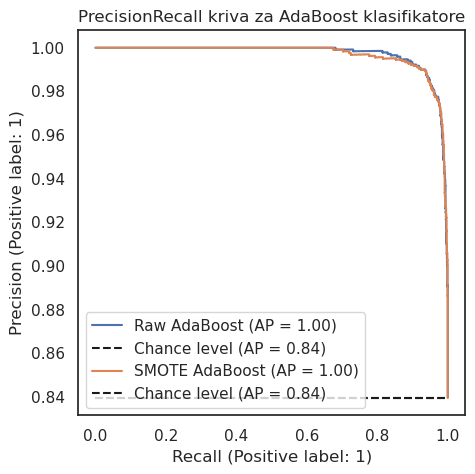

In [585]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5))

PrecisionRecallDisplay.from_estimator(
    best_ada, X_test.copy(deep=True), np.copy(y_test_t), plot_chance_level=True, ax=ax, name="Raw AdaBoost"
)

PrecisionRecallDisplay.from_estimator(
    best_ada_smote, X_test.copy(deep=True), np.copy(y_test_t), plot_chance_level=True, ax=ax, name="SMOTE AdaBoost"
)

plt.title("PrecisionRecall kriva za AdaBoost klasifikatore")

## PCA, Trening na datasetu bez outliera

U fazi pripreme podataka, smo izdvojili neke atribute koriscenjem LOF algoritma. Najbolje modele: **AdaBoost** nad osnovnim podacima, kao i **Voting** nad SMOTE oversample-ovanim podacima cemo probati da dodatno poboljsamo.

Prvo cemo probati trening nad skupom podataka iz kojeg su izbaceni outlier-i u fazi pripreme podataka, a zatim cemo probati PCA tehniku redukcije dimenzionalnosti i uporediti performanse sa osnovnim verzijama ovih modela.

In [1063]:
best_ada

Pipeline(steps=[('pipeline',
                 Pipeline(steps=[('columntransformer-1',
                                  ColumnTransformer(n_jobs=-1,
                                                    remainder='passthrough',
                                                    transformers=[('selector',
                                                                   'drop',
                                                                   ['Avg_Open_To_Buy',
                                                                    'Marital_Status',
                                                                    'Education_Level',
                                                                    'Customer_Age'])],
                                                    verbose_feature_names_out=False)),
                                 ('columntransformer-2',
                                  ColumnTransformer(n_jobs=-1,
                                                    remainder='passthrough',
                                                    transformers=[('n...
                                                                    'Total_Trans_Ct',
                                                                    'Months_on_book'])])),
                                 ('iterativeimputer',
                                  IterativeImputer(initial_strategy='most_frequent',
                                                   max_iter=50,
                                                   missing_values=-1,
                                                   random_state=42))])),
                ('adaboostclassifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=DecisionTreeClassifier(max_depth=1,
                                                                     random_state=42),
                                    learning_rate=1.5071754396542947,
                                    n_estimators=150, random_state=42))])

In [806]:
best_voting_classifier_resampled

Pipeline(steps=[('columntransformer-1',
                 ColumnTransformer(n_jobs=-1, remainder='passthrough',
                                   transformers=[('selector', 'drop',
                                                  ['Avg_Open_To_Buy',
                                                   'Marital_Status',
                                                   'Education_Level',
                                                   'Customer_Age'])],
                                   verbose_feature_names_out=False)),
                ('columntransformer-2',
                 ColumnTransformer(n_jobs=-1, remainder='passthrough',
                                   transformers=[('nominal_transformer',
                                                  Pipeline...
                 VotingClassifier(estimators=[('lreg',
                                               LogisticRegression(C=772.2447692966574,
                                                                  class_weight='balanced',
                                                                  max_iter=500,
                                                                  n_jobs=-1,
                                                                  solver='liblinear')),
                                              ('svm',
                                               SVC(C=198.7156815341724,
                                                   class_weight='balanced',
                                                   probability=True,
                                                   random_state=42)),
                                              ('knn',
                                               KNeighborsClassifier(n_neighbors=7))],
                                  n_jobs=-1, voting='soft',
                                  weights=array([1.87270059, 4.75357153, 3.65996971])))])

### Trening nad datasetom bez outlier-a

In [828]:
train_no_outliers.drop(["is_outlier"], axis=1, inplace=True)
train_no_outliers.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,is_outlier
1602,Attrited Customer,54,F,3,Unknown,Blue,49,6,2,3,13184.0,0,1.166,2047,33,0.179,0.000,1
7791,Existing Customer,51,M,0,$80K - $120K,Blue,45,3,2,3,10648.0,2517,0.708,4930,89,0.978,0.236,1
7177,Existing Customer,45,F,4,$40K - $60K,Blue,29,3,2,1,4595.0,1781,0.708,3746,68,0.545,0.388,1
97,Existing Customer,53,M,3,$40K - $60K,Blue,35,5,3,2,3789.0,1706,1.047,1609,42,0.680,0.450,1
4820,Existing Customer,48,F,2,Unknown,Blue,40,3,2,4,5104.0,736,0.679,3943,78,0.696,0.144,1


In [829]:
train_no_outliers.shape

(7804, 18)

In [830]:
X_train_no = train.drop(["Attrition_Flag"], axis=1)
y_train_no = train["Attrition_Flag"]

In [831]:
X_train_no.shape

(8101, 19)

In [832]:
best_ada.fit(X_train_no, target_enc.fit_transform(y_train_no))

Pipeline(steps=[('pipeline',
                 Pipeline(steps=[('columntransformer-1',
                                  ColumnTransformer(n_jobs=-1,
                                                    remainder='passthrough',
                                                    transformers=[('selector',
                                                                   'drop',
                                                                   ['Avg_Open_To_Buy',
                                                                    'Marital_Status',
                                                                    'Education_Level',
                                                                    'Customer_Age'])],
                                                    verbose_feature_names_out=False)),
                                 ('columntransformer-2',
                                  ColumnTransformer(n_jobs=-1,
                                                    remainder='passthrough',
                                                    transformers=[('n...
                                                                    'Total_Trans_Ct',
                                                                    'Months_on_book'])])),
                                 ('iterativeimputer',
                                  IterativeImputer(initial_strategy='most_frequent',
                                                   max_iter=50,
                                                   missing_values=-1,
                                                   random_state=42))])),
                ('adaboostclassifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=DecisionTreeClassifier(max_depth=1,
                                                                     random_state=42),
                                    learning_rate=1.5071754396542947,
                                    n_estimators=150, random_state=42))])

In [833]:
y_pred_ada_no = best_ada.predict(X_test.copy(deep=True))

              precision    recall  f1-score   support

           0       0.89      0.86      0.87       325
           1       0.97      0.98      0.98      1701

    accuracy                           0.96      2026
   macro avg       0.93      0.92      0.92      2026
weighted avg       0.96      0.96      0.96      2026



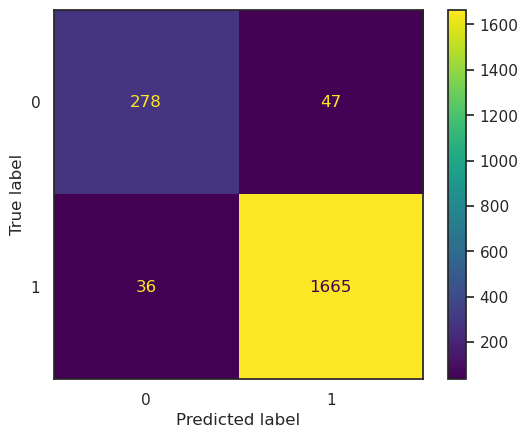

In [834]:
print(sklearn.metrics.classification_report(y_test_t, y_pred_ada_no))
confusion_matrix = sklearn.metrics.confusion_matrix(y_test_t, y_pred_ada_no)
cmd = sklearn.metrics.ConfusionMatrixDisplay(confusion_matrix)
sns.set_style("white")
cmd.plot()

Nema apsolutno nikakve razlike u klasifikaciji kada izbacimo outliere (prema LOF algoritmu) jer ih je malo. Probacemo i za Voting Classifier.

In [835]:
best_voting_classifier_resampled.fit(X_train_no, target_enc.fit_transform(y_train_no))

/home/uros/miniconda3/envs/data_mining/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:1222: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 16.
  warnings.warn(


Pipeline(steps=[('columntransformer-1',
                 ColumnTransformer(n_jobs=-1, remainder='passthrough',
                                   transformers=[('selector', 'drop',
                                                  ['Avg_Open_To_Buy',
                                                   'Marital_Status',
                                                   'Education_Level',
                                                   'Customer_Age'])],
                                   verbose_feature_names_out=False)),
                ('columntransformer-2',
                 ColumnTransformer(n_jobs=-1, remainder='passthrough',
                                   transformers=[('nominal_transformer',
                                                  Pipeline...
                 VotingClassifier(estimators=[('lreg',
                                               LogisticRegression(C=772.2447692966574,
                                                                  class_weight='balanced',
                                                                  max_iter=500,
                                                                  n_jobs=-1,
                                                                  solver='liblinear')),
                                              ('svm',
                                               SVC(C=198.7156815341724,
                                                   class_weight='balanced',
                                                   probability=True,
                                                   random_state=42)),
                                              ('knn',
                                               KNeighborsClassifier(n_neighbors=7))],
                                  n_jobs=-1, voting='soft',
                                  weights=array([1.87270059, 4.75357153, 3.65996971])))])

In [836]:
y_pred_voting_no = best_voting_classifier_resampled.predict(X_test.copy(deep=True))

              precision    recall  f1-score   support

           0       0.78      0.80      0.79       325
           1       0.96      0.96      0.96      1701

    accuracy                           0.93      2026
   macro avg       0.87      0.88      0.88      2026
weighted avg       0.93      0.93      0.93      2026



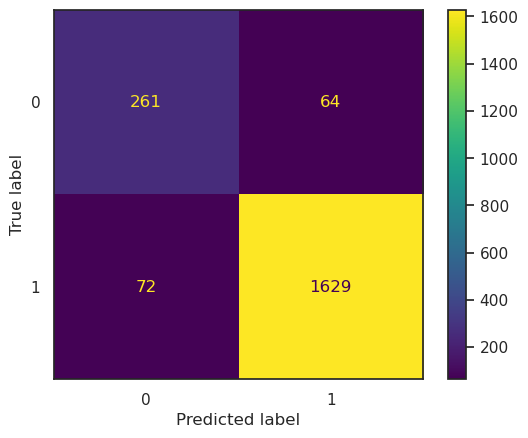

In [837]:
print(sklearn.metrics.classification_report(y_test_t, y_pred_voting_no))
confusion_matrix = sklearn.metrics.confusion_matrix(y_test_t, y_pred_voting_no)
cmd = sklearn.metrics.ConfusionMatrixDisplay(confusion_matrix)
sns.set_style("white")
cmd.plot()

Isto vazi i za VotingClassifier.

### PCA

Probacemo da redukujemo broj atributa tako da preformanse ostanu zadovoljavajuce (mozda cak i bolje). Redukovacemo broj atibuta tako da novokreirani atributi iz PCA algoritma (glavne komponente) zadrze bar 90% pocetne varijanse podataka.

In [1191]:
pca = PCA(n_components=0.90, random_state=42)

In [1192]:
results_ada_pca = run_cv(best_ada["adaboostclassifier"], X_train, y_train_t, pipeline.make_pipeline(best_ada["pipeline"], pca), kf, scoring, train_score=True)

In [1193]:
display_results({"ada_pca": results_ada_pca}, scoring)

,train_precision_avg,test_precision_avg,train_recall_avg,test_recall_avg,train_f1_avg,test_f1_avg,train_acc_avg,test_acc_avg,train_pr_avg,test_pr_avg,train_auc_avg,test_auc_avg
ada_pca,0.913333,0.910787,0.965914,0.96367,0.886577,0.881946,0.894457,0.890261,0.981104,0.973187,0.914421,0.890094


In [1194]:
pca_ada =  pipeline.make_pipeline(pipe, pca, best_ada["adaboostclassifier"])
pca_ada.fit(X_train.copy(deep=True), np.copy(y_train_t))

Pipeline(steps=[('pipeline',
                 Pipeline(steps=[('columntransformer-1',
                                  ColumnTransformer(n_jobs=-1,
                                                    remainder='passthrough',
                                                    transformers=[('selector',
                                                                   'drop',
                                                                   ['Avg_Open_To_Buy',
                                                                    'Marital_Status',
                                                                    'Education_Level',
                                                                    'Customer_Age'])],
                                                    verbose_feature_names_out=False)),
                                 ('columntransformer-2',
                                  ColumnTransformer(n_jobs=-1,
                                                    remainder='passthrough',
                                                    transformers=[('n...
                                 ('iterativeimputer',
                                  IterativeImputer(initial_strategy='most_frequent',
                                                   max_iter=50,
                                                   missing_values=-1,
                                                   random_state=42))])),
                ('pca', PCA(n_components=0.9, random_state=42)),
                ('adaboostclassifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=DecisionTreeClassifier(max_depth=1,
                                                                     random_state=42),
                                    learning_rate=1.5071754396542947,
                                    n_estimators=150, random_state=42))])

In [1195]:
y_pred_pca_ada = pca_ada.predict(X_test.copy(deep=True))

              precision    recall  f1-score   support

           0       0.74      0.52      0.61       325
           1       0.91      0.96      0.94      1701

    accuracy                           0.89      2026
   macro avg       0.83      0.74      0.78      2026
weighted avg       0.89      0.89      0.89      2026



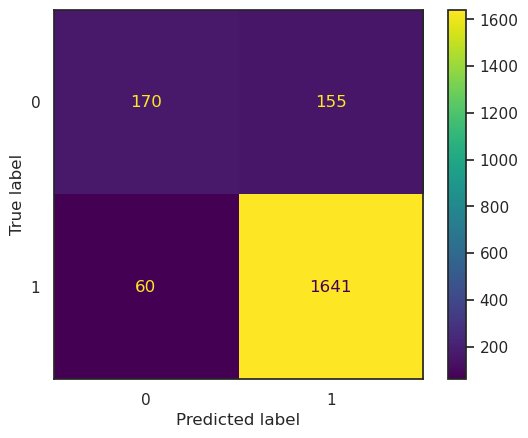

In [1196]:
print(sklearn.metrics.classification_report(y_test_t, y_pred_pca_ada))
confusion_matrix = sklearn.metrics.confusion_matrix(y_test_t, y_pred_pca_ada)
cmd = sklearn.metrics.ConfusionMatrixDisplay(confusion_matrix)
sns.set_style("white")
cmd.plot()

In [ ]:
preprocessing_steps = list(step for step in best_voting_classifier_resampled.named_steps.values() if not isinstance(step, VotingClassifier))
preprocessing_pipe = imblearn.pipeline.make_pipeline(*preprocessing_steps, pca, best_voting_classifier_resampled["votingclassifier"])

results_voting_pca = model_selection.cross_validate(preprocessing_pipe, X_train.copy(deep=True), y_train_t.copy(), cv=kf, scoring=scoring, return_train_score=True, verbose=1)

In [1198]:
display_results({"voting_pca": results_voting_pca}, scoring)

,train_precision_avg,test_precision_avg,train_recall_avg,test_recall_avg,train_f1_avg,test_f1_avg,train_acc_avg,test_acc_avg,train_pr_avg,test_pr_avg,train_auc_avg,test_auc_avg
voting_pca,0.973688,0.937746,0.970143,0.943812,0.953119,0.899637,0.952938,0.900258,0.997335,0.979805,0.985836,0.915888


Nazalost vidimo da u oba slucaja nismo dobili poboljsanje, naprotiv, rezultati su dosta losiji.

## Zakljucak

U ovom projektu demonstrirana su tehnike koriscenja ansambl metoda (koje nisu zasnovane na stablima), za poboljsanje performansi klasifikacije individualnih klasifikatora. Takodje, zbog je demonstrirana i upotreba *imbalanced-learn* biblioteke kao jedno od mogucih resenja problema nebalansirane klasifikacije.

Za vizuelizaciju podataka je koriscena seaborn bibliotek. Na osnovu analize su odredjene strategije za popunjavanje, tj. brisanje nedostajucih vrednosti. Takodje, analizom sam dosao do zakljucka da bih mogao sam da kreiram neke atribute, npr: binarni atribut *No_Credit_Limit*, numericki *Avg_Trans_Amt*, kako bi se resili pojedini pomenuti problemi iz analize. Nazalost, ovi atributi nisu dali nikakvih rezultata, tako da je klasifikacija razdjena sa osnovnim atributima. Takodje, isprobano je izbacivanje outliera - potrebno je bilo pazljivo pregledati da li outlieri postoje i izbaciti neke od njih (ali pazljivo, jer u slucaju izrazito nebalansirane klasifikacije, upravo klasa od interesa moze biti greskom protumacena kao outlier). U te svrhe je koriscen LocalOutlierFactor algoritam, kojim je izbaceno oko 4% outlier-a. Ni ovo izbacivanje nije dovelo do znacajnih poboljsanja.

- Za neke modele je SMOTE dao poboljsanja, npr. Voting, Bagging sa KNN-om, dok je kod drugih rezultate ostavio nepromenjenim u globalu, uz nesto veci akcenat na manjinsku klasu, sto moze biti od interesa (kao kod Stacking i AdaBoost varijanti).
- SMOTE se cesto koristi u kombinaciji sa nekom tehnikom undersampling-a. U ovom projektu je u te svrhe koriscen *EditedNearestNeighbours* algoritam pomenute bibilioteke, ali ni u jednom slucaju nam nije dao bolje rezultate.
- **Od svih klasifikatora AdaBoost se najbolje pokazao**, sto je meni bilo prilicno interesantno.
- Stacking klasifikatorom smo poboljsali performanse individualnih biased modela i dobili novi model koji je bolji od svakog od njih pojedinacno.
- Voting klasifikator je koristio tri vec prilicno dobra modela i dao jos neznatno bolje rezultate - ovo i jeste njegova glavna ideja.
- Bagging klasifikator je suprotan Stacking-u - od 3 modela koja su bila preprilagodjena nasim podacima smo dobili jedan koji se dosta bolje generalizuje na nove primere.

